## <span style="color:yellow">***Data Story***</span>

## <span style="color:yellow">***feature to be predicted------ Turbine energy yield (TEY)***</span>

<div style='text-align: justify;'>
 The dataset contains 36538 instances of 11 sensor measures aggregated over one hour (by means of average or sum) from a gas turbine located in Turkey's north western region for the purpose of studying flue gas emissions, namely CO and NOx (NO + NO2). The data comes from the same power plant as the dataset used for predicting hourly net energy yield.  
</div>  

<div style='text-align: justify;'>  This data is  collected in another data  range (01.01.2011 - 31.12.2015), includes gas turbine parameters (such as Turbine Inlet Temperature and Compressor Discharge pressure) in addition to the ambient variables. Note that the dates are not given in the instances but the data are sorted in chronological order. The dataset can be well used for predicting turbine energy yield (TEY) using ambient variables as features."</div>


| ariable (Abbr.)  | Unit| Min| Max  |Mean | 
| ------------- | ------------- |-------------|-------------|-------------|
| Ambient temperature (AT)  | C | 6.23| 37.10  |17.71 | 
| Ambient pressure (AP)  | mbar | 985.85| 1036.56  |1013.07 | 
| Ambient humidity (AH)  |(%) | 24.08| 100.20  |77.87 | 
| Air filter difference pressure (AFDP)  | mbar | 2.09| 7.61  |3.93 | 
| Gas turbine exhaust pressure (GTEP)  | mbar | 17.70| 40.72  |25.56 | 
| Turbine inlet temperature (TIT)  | C | 1000.85| 1100.89  |1081.43 | 
| Turbine after temperature (TAT)  | C | 511.04| 550.61  |546.16 |
| Compressor discharge pressure (CDP)  |mbar | 9.85| 15.16  |12.06 |
| Turbine energy yield (TEY)  | MWH | 100.02| 179.50  |133.51 | 
| Carbon monoxide (CO)  | mg/m3 | 0.00| 44.10  |2.37 |
| Nitrogen oxides (NOx)  | mg/m3 | 25.90| 119.91  |65.29 |



- ####  ***AT----    Ambient Temperature------ Temperature of the surrounding air (°C)***
- #### ***AP----    Ambient Pressure------Atmospheric pressure at the turbine site (mbar)***
- #### ***AH----    Ambient Humidity------Moisture content in the air (%)***
- #### ***AFDP----  Air Filter Differential Pressure-----Pressure difference across the air filter (mbar), indicating filter status***
- #### ***GTEP----   Gas Turbine Exhaust Pressure------Pressure of exhaust gases leaving the turbine (mbar)***
- #### ***TIT----    Turbine Inlet Temperature----- Temperature of gases entering the turbine (°C)***
- #### ***TAT----    Turbine After Temperature----   Temperature after the turbine stage (°C)***
- #### ***TEY----    Turbine Energy Yield-----       Energy output from the turbine (MWh)***
- #### ***CDP----    Compressor Discharge Pressure---- Pressure after air compression (mbar)***
- #### ***CO----     Carbon Monoxide Emissions-----    Concentration of CO in exhaust (mg/m³)***
- #### ***NOX----    Nitrogen Oxides Emissions-----    Concentration of NO and NO₂ in exhaust (mg/m³)***
 

In [216]:
import warnings #Used to manage warning messages in Python
import sys #Provides access to system-specific parameters and functions
if not sys.warnoptions:
    warnings.simplefilter("ignore")
import pandas as pd #A powerful library for data manipulation and analysis
import numpy as np #Focused on numerical computations. It provides support for arrays, matrices, and mathematical functions
import matplotlib.pyplot as plt #used for creating static, interactive, and animated visualizations like line plots, bar graphs, histograms, etc.
import seaborn as sns #this library simplifies creating visually appealing and informative statistical graphics such as heatmaps and pair plots
from scipy.stats import skew # tools for statistical computations such as calculating skewness, probability distributions, and hypothesis testing.
from sklearn.preprocessing import StandardScaler #Used for feature scaling in machine learning.
from sklearn.model_selection import train_test_split #Splits datasets into training and testing subsets
from sklearn.linear_model import LinearRegression #Implements a simple and commonly used linear regression algorithm for predicting continuous outcomes. 
                                                   # eg: predicting the length of hospital stays based on patient demographics and conditions

### <span style="color:yellow">***Loading and Preprocessing------ Load the dataset and perform the necessary preprocessing steps***</span>

# <span style="color:#DC143C">***Exploratory Data Analysis*** </span>

In [220]:
# Specify the path to your CSV file
csv_file_path = ('C:/Users/asus/gt_2011_2015.csv')

# Load the CSV file into a DataFrame
df=pd.read_csv("gt_2011_2015.csv")

# csv_file_path = ('C:/Users/asus/merged2011-2015.csv')

# csv_file_path = ('C:/Users/asus/gt_2011.csv')


In [222]:
# Display the first few rows of the dataset
display(df.head(10))


,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,134.67,11.898,0.32663,81.952
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,134.67,11.892,0.44784,82.377
2,3.9045,1018.4,84.858,3.5828,23.99,1086.5,550.19,135.1,12.042,0.45144,83.776
3,3.7436,1018.3,85.434,3.5808,23.911,1086.5,550.17,135.03,11.99,0.23107,82.505
4,3.7516,1017.8,85.182,3.5781,23.917,1085.9,550,134.67,11.91,0.26747,82.028
5,3.8858,1017.7,83.946,3.5824,23.903,1086,549.98,134.67,11.868,0.23473,81.748
6,3.6697,1018,84.114,3.5804,23.889,1085.9,550.04,134.68,11.877,0.44412,84.592
7,3.5892,1018.2,83.867,3.5777,23.876,1086,549.88,134.66,11.893,0.79996,84.193
8,3.7108,1018.5,84.948,3.6027,23.957,1086.3,549.98,134.65,11.87,0.68996,83.978
9,4.8281,1018.5,85.346,3.5158,23.422,1083.1,549.8,132.67,11.694,1.0281,82.654


Ambient temperature (AT)  
Ambient pressure (AP  
Ambient humidity (AH)  
Air filter difference pressure (AFDP)   
Gas turbine exhaust pressure (GTEP)  
Turbine inlet temperature (TIT)  
Turbine after temperature (TAT)
Compressor discharge pressure (CDP)  
Turbine energy yield (TEY)  
Carbon monoxide (CO)  
Nitrogen oxides (NOx)  


In [225]:
column_map = {
    'AT': 'Ambient Temperature(AT)',
    'AP': 'Ambient Pressure(AP)',
    'AH': 'Ambient Humidity(AH)',
    'AFDP': 'Air Filter Difference Pressure(AFDP)',
    'GTEP': 'Gas Turbine Exhaust Pressure(GTEP)',
    'TIT': 'Turbine Inlet Temperature(TIT)',
    'TAT': 'Turbine After Temperature(TAT)',
    'CDP': 'Compressor Discharge Pressure(CDP)',
    'TEY': 'Turbine Energy Yield(TEY)',
    'CO': 'Carbon Monoxide(CO)',
    'NOX': 'Nitrogen Oxides(NOX)'
}

df.rename(columns=column_map, inplace=True)


In [227]:
df

,Ambient Temperature(AT),Ambient Pressure(AP),Ambient Humidity(AH),Air Filter Difference Pressure(AFDP),Gas Turbine Exhaust Pressure(GTEP),Turbine Inlet Temperature(TIT),Turbine After Temperature(TAT),Turbine Energy Yield(TEY),Compressor Discharge Pressure(CDP),Carbon Monoxide(CO),Nitrogen Oxides(NOX)
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,134.67,11.898,0.32663,81.952
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,134.67,11.892,0.44784,82.377
2,3.9045,1018.4,84.858,3.5828,23.99,1086.5,550.19,135.1,12.042,0.45144,83.776
3,3.7436,1018.3,85.434,3.5808,23.911,1086.5,550.17,135.03,11.99,0.23107,82.505
4,3.7516,1017.8,85.182,3.5781,23.917,1085.9,550,134.67,11.91,0.26747,82.028
...,...,...,...,...,...,...,...,...,...,...,...
36533,3.3075,1028.2,88.381,3.9198,25.763,1090.1,550.34,144.16,12.471,2.6565,66.027
36534,3.346,1027.9,91.202,4.0573,25.737,1090,550.27,143.79,12.435,2.7395,65.332
36535,3.8638,1027.7,91.714,4.1581,25.649,1089.5,549.71,143.25,12.413,2.5587,64.824
36536,4.2652,1027.6,91.303,4.2315,25.674,1089.3,549.61,143.04,12.454,2.5262,63.354


In [229]:
df.shape

(36538, 11)

In [231]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36538 entries, 0 to 36537
Data columns (total 11 columns):
 #   Column                                Non-Null Count  Dtype 
---  ------                                --------------  ----- 
 0   Ambient Temperature(AT)               36538 non-null  object
 1   Ambient Pressure(AP)                  36537 non-null  object
 2   Ambient Humidity(AH)                  36537 non-null  object
 3   Air Filter Difference Pressure(AFDP)  36537 non-null  object
 4   Gas Turbine Exhaust Pressure(GTEP)    36537 non-null  object
 5   Turbine Inlet Temperature(TIT)        36537 non-null  object
 6   Turbine After Temperature(TAT)        36537 non-null  object
 7   Turbine Energy Yield(TEY)             36537 non-null  object
 8   Compressor Discharge Pressure(CDP)    36537 non-null  object
 9   Carbon Monoxide(CO)                   36537 non-null  object
 10  Nitrogen Oxides(NOX)                  36537 non-null  object
dtypes: object(11)
memory usage: 

### All the fields datatype is showing as object though the data type is float .Hence it needs to be changed to float

In [234]:
# #convert points column from object to float
# df['points'] = pd.to_numeric(df['Ambient Temperature(AT)','Ambient Pressure(AP)','Ambient Humidity(AH)','Air Filter Difference Pressure(AFDP)',
# 'Gas Turbine Exhaust Pressure(GTEP)','Turbine Inlet Temperature(TIT)','Turbine After Temperature(TAT)','Turbine Energy Yield(TEY)',
# 'Compressor Discharge Pressure(CDP)','arbon Monoxide(CO)','Nitrogen Oxides(NOX)'])


cols_to_convert = [
    'Ambient Temperature(AT)', 'Ambient Pressure(AP)', 'Ambient Humidity(AH)',
    'Air Filter Difference Pressure(AFDP)', 'Gas Turbine Exhaust Pressure(GTEP)',
    'Turbine Inlet Temperature(TIT)', 'Turbine After Temperature(TAT)',
    'Turbine Energy Yield(TEY)', 'Compressor Discharge Pressure(CDP)',
    'Carbon Monoxide(CO)', 'Nitrogen Oxides(NOX)'  # fixed typo here
]

df[cols_to_convert] = df[cols_to_convert].apply(pd.to_numeric, errors='coerce')



In [236]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36538 entries, 0 to 36537
Data columns (total 11 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Ambient Temperature(AT)               36533 non-null  float64
 1   Ambient Pressure(AP)                  36533 non-null  float64
 2   Ambient Humidity(AH)                  36533 non-null  float64
 3   Air Filter Difference Pressure(AFDP)  36533 non-null  float64
 4   Gas Turbine Exhaust Pressure(GTEP)    36533 non-null  float64
 5   Turbine Inlet Temperature(TIT)        36533 non-null  float64
 6   Turbine After Temperature(TAT)        36533 non-null  float64
 7   Turbine Energy Yield(TEY)             36533 non-null  float64
 8   Compressor Discharge Pressure(CDP)    36533 non-null  float64
 9   Carbon Monoxide(CO)                   36533 non-null  float64
 10  Nitrogen Oxides(NOX)                  36533 non-null  float64
dtypes: float64(11)


In [238]:
df.nunique()

Ambient Temperature(AT)                 22386
Ambient Pressure(AP)                      788
Ambient Humidity(AH)                    25629
Air Filter Difference Pressure(AFDP)    20421
Gas Turbine Exhaust Pressure(GTEP)      12916
Turbine Inlet Temperature(TIT)            799
Turbine After Temperature(TAT)           2767
Turbine Energy Yield(TEY)                6222
Compressor Discharge Pressure(CDP)       4443
Carbon Monoxide(CO)                     26056
Nitrogen Oxides(NOX)                    23547
dtype: int64

In [240]:
df.describe()

,Ambient Temperature(AT),Ambient Pressure(AP),Ambient Humidity(AH),Air Filter Difference Pressure(AFDP),Gas Turbine Exhaust Pressure(GTEP),Turbine Inlet Temperature(TIT),Turbine After Temperature(TAT),Turbine Energy Yield(TEY),Compressor Discharge Pressure(CDP),Carbon Monoxide(CO),Nitrogen Oxides(NOX)
count,36533.000000,36533.000000,36533.000000,36533.00000,36533.000000,36533.000000,36533.000000,36533.000000,36533.000000,36533.000000,36533.000000
mean,17.769665,1013.056620,77.866589,3.92741,25.549613,1081.421523,546.185795,133.450701,12.057310,2.367636,65.284879
std,7.420883,6.444952,14.482910,0.77367,4.184717,17.504203,6.828354,15.564885,1.085479,2.261994,11.662647
min,-6.234800,985.850000,24.085000,2.08740,17.698000,1000.800000,511.040000,100.020000,9.851800,0.000388,25.905000
25%,11.849000,1008.800000,68.159000,3.35710,23.132000,1071.800000,544.830000,124.480000,11.436000,1.180100,57.143000
50%,17.872000,1012.600000,80.474000,3.93960,25.099000,1085.900000,549.880000,133.730000,11.964000,1.709900,63.853000
75%,23.699000,1017.000000,89.401000,4.37830,28.971000,1096.800000,550.040000,143.680000,12.824000,2.836200,71.547000
max,37.103000,1036.600000,100.200000,7.61060,40.716000,1100.900000,550.610000,179.500000,15.159000,44.103000,119.910000


### check for column-wise missing values in a  DataFrame

In [243]:
df.isnull().sum()

Ambient Temperature(AT)                 5
Ambient Pressure(AP)                    5
Ambient Humidity(AH)                    5
Air Filter Difference Pressure(AFDP)    5
Gas Turbine Exhaust Pressure(GTEP)      5
Turbine Inlet Temperature(TIT)          5
Turbine After Temperature(TAT)          5
Turbine Energy Yield(TEY)               5
Compressor Discharge Pressure(CDP)      5
Carbon Monoxide(CO)                     5
Nitrogen Oxides(NOX)                    5
dtype: int64

### removes all rows in your DataFrame that contain at least one missing value (NaN).


In [246]:
df[df.isnull().any(axis=1)]

,Ambient Temperature(AT),Ambient Pressure(AP),Ambient Humidity(AH),Air Filter Difference Pressure(AFDP),Gas Turbine Exhaust Pressure(GTEP),Turbine Inlet Temperature(TIT),Turbine After Temperature(TAT),Turbine Energy Yield(TEY),Compressor Discharge Pressure(CDP),Carbon Monoxide(CO),Nitrogen Oxides(NOX)
7411,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15040,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
22193,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
29202,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36537,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Removes all rows in  dataFrame that contain at least one missing value (NaN). Since all the columns are null we can delete the entire rows

In [249]:
df.dropna(inplace=True)


In [251]:
display (df)

,Ambient Temperature(AT),Ambient Pressure(AP),Ambient Humidity(AH),Air Filter Difference Pressure(AFDP),Gas Turbine Exhaust Pressure(GTEP),Turbine Inlet Temperature(TIT),Turbine After Temperature(TAT),Turbine Energy Yield(TEY),Compressor Discharge Pressure(CDP),Carbon Monoxide(CO),Nitrogen Oxides(NOX)
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,134.67,11.898,0.32663,81.952
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,134.67,11.892,0.44784,82.377
2,3.9045,1018.4,84.858,3.5828,23.990,1086.5,550.19,135.10,12.042,0.45144,83.776
3,3.7436,1018.3,85.434,3.5808,23.911,1086.5,550.17,135.03,11.990,0.23107,82.505
4,3.7516,1017.8,85.182,3.5781,23.917,1085.9,550.00,134.67,11.910,0.26747,82.028
...,...,...,...,...,...,...,...,...,...,...,...
36532,4.3124,1028.1,83.887,3.7619,25.853,1090.4,550.19,144.26,12.463,2.71900,65.610
36533,3.3075,1028.2,88.381,3.9198,25.763,1090.1,550.34,144.16,12.471,2.65650,66.027
36534,3.3460,1027.9,91.202,4.0573,25.737,1090.0,550.27,143.79,12.435,2.73950,65.332
36535,3.8638,1027.7,91.714,4.1581,25.649,1089.5,549.71,143.25,12.413,2.55870,64.824


# Identify duplicate rows in a DataFrame.


In [254]:
# Find duplicate rows
duplicates = df[df.duplicated(keep=False)]




# Display all duplicate rows
print(f"Total duplicate rows: {duplicates.shape[0]}")
display(duplicates)


Total duplicate rows: 9


,Ambient Temperature(AT),Ambient Pressure(AP),Ambient Humidity(AH),Air Filter Difference Pressure(AFDP),Gas Turbine Exhaust Pressure(GTEP),Turbine Inlet Temperature(TIT),Turbine After Temperature(TAT),Turbine Energy Yield(TEY),Compressor Discharge Pressure(CDP),Carbon Monoxide(CO),Nitrogen Oxides(NOX)
26401,23.156,1004.2,95.938,4.0547,24.672,1076.6,549.87,127.01,11.835,1.7056,47.352
26402,23.156,1004.2,95.938,4.0547,24.672,1076.6,549.87,127.01,11.835,1.7056,47.352
26403,23.156,1004.2,95.938,4.0547,24.672,1076.6,549.87,127.01,11.835,1.7056,47.352
26404,23.156,1004.2,95.938,4.0547,24.672,1076.6,549.87,127.01,11.835,1.7056,47.352
26405,23.156,1004.2,95.938,4.0547,24.672,1076.6,549.87,127.01,11.835,1.7056,47.352
27391,26.067,1008.3,87.328,5.0703,29.984,1099.1,546.78,146.14,13.038,1.3163,52.564
27392,26.067,1008.3,87.328,5.0703,29.984,1099.1,546.78,146.14,13.038,1.3163,52.564
27393,26.067,1008.3,87.328,5.0703,29.984,1099.1,546.78,146.14,13.038,1.3163,52.564
27394,26.067,1008.3,87.328,5.0703,29.984,1099.1,546.78,146.14,13.038,1.3163,52.564


###  Drop Duplicates: Cleaning Redundant Entries


In [272]:
df.drop_duplicates(inplace=True)

In [274]:
df

,Ambient Temperature(AT),Ambient Pressure(AP),Ambient Humidity(AH),Air Filter Difference Pressure(AFDP),Gas Turbine Exhaust Pressure(GTEP),Turbine Inlet Temperature(TIT),Turbine After Temperature(TAT),Turbine Energy Yield(TEY),Compressor Discharge Pressure(CDP),Carbon Monoxide(CO),Nitrogen Oxides(NOX)
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,134.67,11.898,0.32663,81.952
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,134.67,11.892,0.44784,82.377
2,3.9045,1018.4,84.858,3.5828,23.990,1086.5,550.19,135.10,12.042,0.45144,83.776
3,3.7436,1018.3,85.434,3.5808,23.911,1086.5,550.17,135.03,11.990,0.23107,82.505
4,3.7516,1017.8,85.182,3.5781,23.917,1085.9,550.00,134.67,11.910,0.26747,82.028
...,...,...,...,...,...,...,...,...,...,...,...
36532,4.3124,1028.1,83.887,3.7619,25.853,1090.4,550.19,144.26,12.463,2.71900,65.610
36533,3.3075,1028.2,88.381,3.9198,25.763,1090.1,550.34,144.16,12.471,2.65650,66.027
36534,3.3460,1027.9,91.202,4.0573,25.737,1090.0,550.27,143.79,12.435,2.73950,65.332
36535,3.8638,1027.7,91.714,4.1581,25.649,1089.5,549.71,143.25,12.413,2.55870,64.824


### Mean of the numerical columns

In [277]:
df.mean()

Ambient Temperature(AT)                   17.768394
Ambient Pressure(AP)                    1013.057980
Ambient Humidity(AH)                      77.863833
Air Filter Difference Pressure(AFDP)       3.927302
Gas Turbine Exhaust Pressure(GTEP)        25.549345
Turbine Inlet Temperature(TIT)          1081.420599
Turbine After Temperature(TAT)           546.185343
Turbine Energy Yield(TEY)                133.450364
Compressor Discharge Pressure(CDP)        12.057254
Carbon Monoxide(CO)                        2.367795
Nitrogen Oxides(NOX)                      65.287888
dtype: float64

### Column-wise Standard Deviation


In [282]:
df.std()

Ambient Temperature(AT)                  7.420999
Ambient Pressure(AP)                     6.444759
Ambient Humidity(AH)                    14.482809
Air Filter Difference Pressure(AFDP)     0.773674
Gas Turbine Exhaust Pressure(GTEP)       4.184915
Turbine Inlet Temperature(TIT)          17.505075
Turbine After Temperature(TAT)           6.828897
Turbine Energy Yield(TEY)               15.565805
Compressor Discharge Pressure(CDP)       1.085544
Carbon Monoxide(CO)                      2.262180
Nitrogen Oxides(NOX)                    11.661684
dtype: float64

###  Feature Variance Summary


In [288]:
print(df.var())


Ambient Temperature(AT)                  55.071223
Ambient Pressure(AP)                     41.534921
Ambient Humidity(AH)                    209.751768
Air Filter Difference Pressure(AFDP)      0.598571
Gas Turbine Exhaust Pressure(GTEP)       17.513517
Turbine Inlet Temperature(TIT)          306.427643
Turbine After Temperature(TAT)           46.633838
Turbine Energy Yield(TEY)               242.294298
Compressor Discharge Pressure(CDP)        1.178406
Carbon Monoxide(CO)                       5.117460
Nitrogen Oxides(NOX)                    135.994881
dtype: float64


# <span style="color:yellow">***Univariate Analysis*** </span>

### Frequency count of how many times each unique ambient temperature value appears 


In [292]:
df["Ambient Temperature(AT)"].value_counts()

Ambient Temperature(AT)
23.9690    8
18.5250    8
11.9200    8
19.2630    7
25.5970    7
          ..
22.2190    1
20.4360    1
18.9120    1
18.6240    1
4.2652     1
Name: count, Length: 22386, dtype: int64

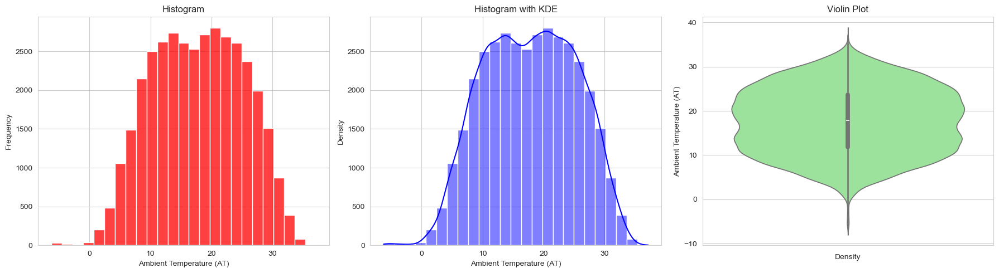

In [294]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 3 subplots side-by-side

# 1️⃣ Histogram (histplot)
sns.histplot(df['Ambient Temperature(AT)'], color='red', bins=25, kde=False, ax=axes[0])
axes[0].set_title('Histogram')
axes[0].set_xlabel('Ambient Temperature (AT)')
axes[0].set_ylabel('Frequency')

# 2️⃣ Distplot with KDE
# Note: distplot is deprecated; use displot or histplot + kdeplot going forward
sns.histplot(df['Ambient Temperature(AT)'], color='blue', bins=25, kde=True, ax=axes[1])
axes[1].set_title('Histogram with KDE')
axes[1].set_xlabel('Ambient Temperature (AT)')
axes[1].set_ylabel('Density')

# 3️⃣ Violin Plot
sns.violinplot(y=df['Ambient Temperature(AT)'], color='lightgreen', ax=axes[2])
axes[2].set_title('Violin Plot')
axes[2].set_ylabel('Ambient Temperature (AT)')
axes[2].set_xlabel('Density')

# Improve spacing
plt.tight_layout()
plt.show()

- The data peaks between 20°C and 30°C, with frequencies nearing 3000 observations—suggesting that turbines most commonly operate within this thermal band.(Histogram)
- The KDE reveals a slight positive skew, with a gentle tail extending toward warmer temperatures.(Histo with KDE)
- The embedded box plot shows a tight interquartile range, suggesting that AT values are stable and predictable.(Violin plot)


### frequency count of how many times each unique Ambient Pressure(AP) value appears 


In [298]:
df["Ambient Pressure(AP)"].value_counts()

Ambient Pressure(AP)
1012.10    296
1010.80    288
1011.90    283
1011.80    283
1011.10    283
          ... 
998.09       1
997.97       1
997.30       1
997.54       1
988.21       1
Name: count, Length: 788, dtype: int64

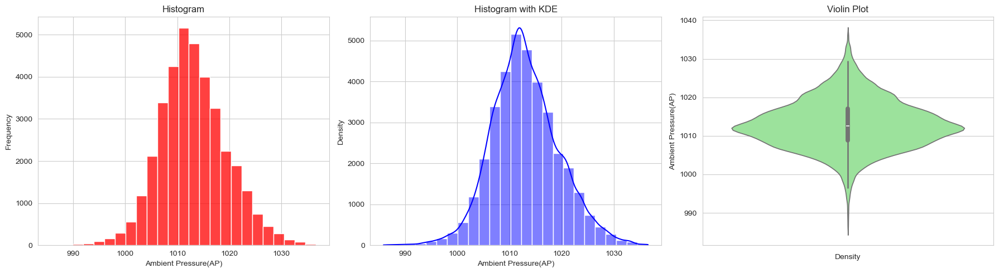

In [300]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 3 subplots side-by-side

# 1️⃣ Histogram (histplot)
sns.histplot(df['Ambient Pressure(AP)'], color='red', bins=25, kde=False, ax=axes[0])
axes[0].set_title('Histogram')
axes[0].set_xlabel('Ambient Pressure(AP)')
axes[0].set_ylabel('Frequency')

# 2️⃣ Distplot with KDE
# Note: distplot is deprecated; use displot or histplot + kdeplot going forward
sns.histplot(df['Ambient Pressure(AP)'], color='blue', bins=25, kde=True, ax=axes[1])
axes[1].set_title('Histogram with KDE')
axes[1].set_xlabel('Ambient Pressure(AP)')
axes[1].set_ylabel('Density')

# 3️⃣ Violin Plot
sns.violinplot(y=df['Ambient Pressure(AP)'], color='lightgreen', ax=axes[2])
axes[2].set_title('Violin Plot')
axes[2].set_ylabel('Ambient Pressure(AP)')
axes[2].set_xlabel('Density')

# Improve spacing
plt.tight_layout()
plt.show()

- Peak bin: Falls between 1010 and 1020 , with frequency surging toward 5000 (Histogram plot)
- KDE peak aligns tightly with histogram mode (~1015–1020 hPa), suggesting well-centered distribution.(Histogram with Kde)
- Median placement: Centered near 1015–1016 hPa, tightly matches KDE and histogram—confirms distribution symmetry.(violin plot)




In [303]:
df["Ambient Humidity(AH)"].value_counts()

Ambient Humidity(AH)
100.140    46
100.120    46
100.150    42
100.160    42
100.110    38
           ..
63.928      1
95.661      1
86.101      1
81.909      1
88.381      1
Name: count, Length: 25629, dtype: int64

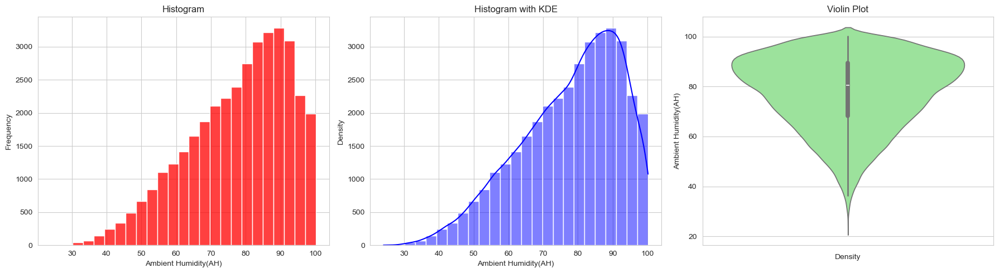

In [305]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 3 subplots side-by-side

# 1️⃣ Histogram (histplot)
sns.histplot(df['Ambient Humidity(AH)'], color='red', bins=25, kde=False, ax=axes[0])
axes[0].set_title('Histogram')
axes[0].set_xlabel('Ambient Humidity(AH)')
axes[0].set_ylabel('Frequency')

# 2️⃣ Distplot with KDE
# Note: distplot is deprecated; use displot or histplot + kdeplot going forward
sns.histplot(df['Ambient Humidity(AH)'], color='blue', bins=25, kde=True, ax=axes[1])
axes[1].set_title('Histogram with KDE')
axes[1].set_xlabel('Ambient Humidity(AH)')
axes[1].set_ylabel('Density')

# 3️⃣ Violin Plot
sns.violinplot(y=df['Ambient Humidity(AH)'], color='lightgreen', ax=axes[2])
axes[2].set_title('Violin Plot')
axes[2].set_ylabel('Ambient Humidity(AH)')
axes[2].set_xlabel('Density')

# Improve spacing
plt.tight_layout()
plt.show()

- Peak zone: 90–100% AH ,this bin towers over the rest, with more than 3000 occurrences.(Histogram)
-  KDE peak: 85–95% AH ,the KDE curve reinforces that most readings cluster in upper humidity ranges.(Histogram with KDE)
-   Median (central horizontal line): Around 88–90% AH, suggesting turbines operate most frequently in very humid conditions.Violin plot)
-   Interquartile Range (IQR): Spanning roughly 80–95% AH, which shows a narrow spread—excellent for modeling stability.(violin plot)

In [307]:
df["Air Filter Difference Pressure(AFDP)"].value_counts()

Air Filter Difference Pressure(AFDP)
3.2115    9
3.7056    8
3.5297    8
4.1601    8
3.8733    8
         ..
3.0627    1
4.4378    1
4.3924    1
4.5510    1
3.7842    1
Name: count, Length: 20421, dtype: int64

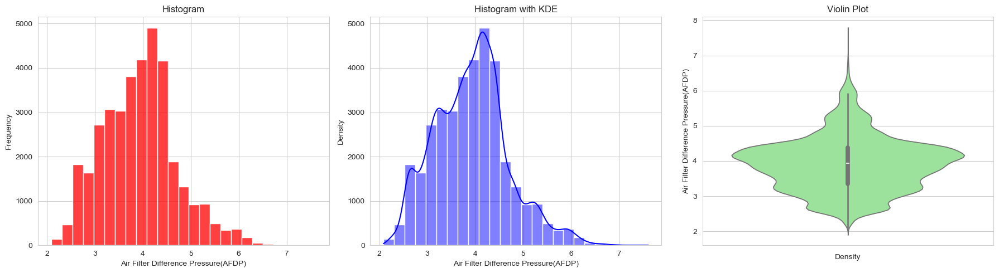

In [310]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 3 subplots side-by-side

# 1️⃣ Histogram (histplot)
sns.histplot(df['Air Filter Difference Pressure(AFDP)'], color='red', bins=25, kde=False, ax=axes[0])
axes[0].set_title('Histogram')
axes[0].set_xlabel('Air Filter Difference Pressure(AFDP)')
axes[0].set_ylabel('Frequency')

# 2️⃣ Distplot with KDE
# Note: distplot is deprecated; use displot or histplot + kdeplot going forward
sns.histplot(df['Air Filter Difference Pressure(AFDP)'], color='blue', bins=25, kde=True, ax=axes[1])
axes[1].set_title('Histogram with KDE')
axes[1].set_xlabel('Air Filter Difference Pressure(AFDP)')
axes[1].set_ylabel('Density')

# 3️⃣ Violin Plot
sns.violinplot(y=df['Air Filter Difference Pressure(AFDP)'], color='lightgreen', ax=axes[2])
axes[2].set_title('Violin Plot')
axes[2].set_ylabel('Air Filter Difference Pressure(AFDP)')
axes[2].set_xlabel('Density')

# Improve spacing
plt.tight_layout()
plt.show()

- Shape & Spread: Most values lie between 3.5 to 5.5, with a prominent peak around 4.5.(Histogram)
- Smooth Density Curve: Highlights a unimodal, slightly right-skewed distribution. (Histogram with KDE)
- Density + Quartile View: The narrow tail at the bottom and wider spread between 4 and 5.5 reinforces central clustering.(Violin)

In [313]:
df["Gas Turbine Exhaust Pressure(GTEP)"].value_counts()

Gas Turbine Exhaust Pressure(GTEP)
24.308    18
25.463    16
25.487    15
25.184    15
25.106    15
          ..
32.110     1
34.283     1
32.705     1
32.132     1
34.587     1
Name: count, Length: 12916, dtype: int64

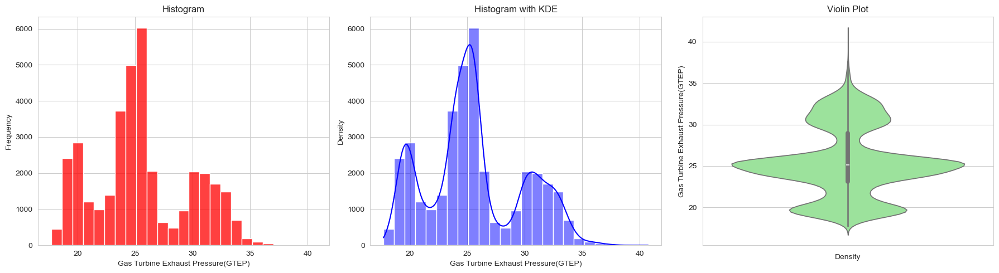

In [315]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 3 subplots side-by-side

# 1️⃣ Histogram (histplot)
sns.histplot(df['Gas Turbine Exhaust Pressure(GTEP)'], color='red', bins=25, kde=False, ax=axes[0])
axes[0].set_title('Histogram')
axes[0].set_xlabel('Gas Turbine Exhaust Pressure(GTEP)')
axes[0].set_ylabel('Frequency')

# 2️⃣ Distplot with KDE
# Note: distplot is deprecated; use displot or histplot + kdeplot going forward
sns.histplot(df['Gas Turbine Exhaust Pressure(GTEP)'], color='blue', bins=25, kde=True, ax=axes[1])
axes[1].set_title('Histogram with KDE')
axes[1].set_xlabel('Gas Turbine Exhaust Pressure(GTEP)')
axes[1].set_ylabel('Density')

# 3️⃣ Violin Plot
sns.violinplot(y=df['Gas Turbine Exhaust Pressure(GTEP)'], color='lightgreen', ax=axes[2])
axes[2].set_title('Violin Plot')
axes[2].set_ylabel('Gas Turbine Exhaust Pressure(GTEP)')
axes[2].set_xlabel('Density')

# Improve spacing
plt.tight_layout()
plt.show()

- Concentration Zone: Bulk of observations position around 25, confirming it as the dominant operating band.(Histogram)
- Density Peaks: Three gentle humps around 20, 25, and 30 imply multimodal tendencies(Histogram with KDE)
- Embedded Boxplot: Median seems centered around 25, reinforcing histogram findings(violin)


In [318]:
df["Turbine Inlet Temperature(TIT)"].value_counts()

Turbine Inlet Temperature(TIT)
1100.0    2698
1099.9    2126
1100.1    1311
1099.8     862
1100.2     523
          ... 
1026.3       1
1002.9       1
1007.9       1
1024.5       1
1029.6       1
Name: count, Length: 799, dtype: int64

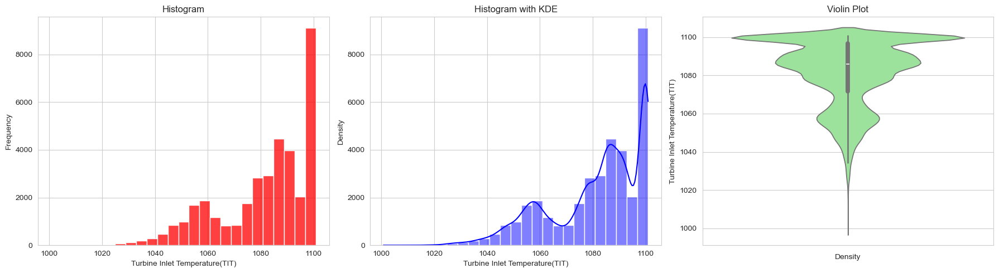

In [320]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 3 subplots side-by-side

# 1️⃣ Histogram (histplot)
sns.histplot(df['Turbine Inlet Temperature(TIT)'], color='red', bins=25, kde=False, ax=axes[0])
axes[0].set_title('Histogram')
axes[0].set_xlabel('Turbine Inlet Temperature(TIT)')
axes[0].set_ylabel('Frequency')

# 2️⃣ Distplot with KDE
# Note: distplot is deprecated; use displot or histplot + kdeplot going forward
sns.histplot(df['Turbine Inlet Temperature(TIT)'], color='blue', bins=25, kde=True, ax=axes[1])
axes[1].set_title('Histogram with KDE')
axes[1].set_xlabel('Turbine Inlet Temperature(TIT)')
axes[1].set_ylabel('Density')

# 3️⃣ Violin Plot
sns.violinplot(y=df['Turbine Inlet Temperature(TIT)'], color='lightgreen', ax=axes[2])
axes[2].set_title('Violin Plot')
axes[2].set_ylabel('Turbine Inlet Temperature(TIT)')
axes[2].set_xlabel('Density')

# Improve spacing
plt.tight_layout()
plt.show()

- Concentration peaks around 1090–1100°C, suggesting this is the dominant temperature range during normal turbine operation.(Histogram)
- KDE peaks: Multiple humps suggest possible multimodal distribution,- Slight right-skew(Hist with KDE)
- IQR (Interquartile Range): Narrow, roughly 1065–1100°C, showing high operational consistency.(Violin)

In [323]:
df["Gas Turbine Exhaust Pressure(GTEP)"].value_counts()


Gas Turbine Exhaust Pressure(GTEP)
24.308    18
25.463    16
25.487    15
25.184    15
25.106    15
          ..
32.110     1
34.283     1
32.705     1
32.132     1
34.587     1
Name: count, Length: 12916, dtype: int64

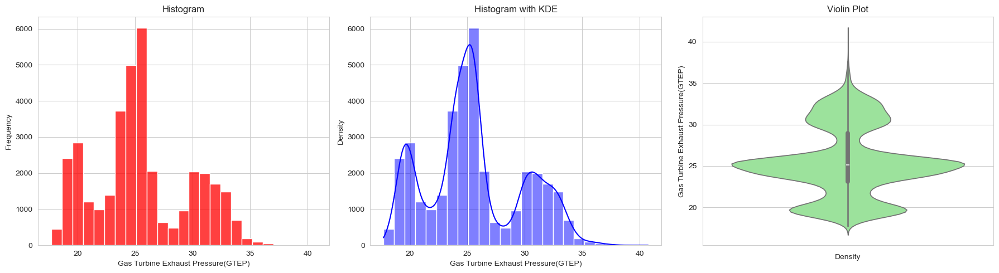

In [325]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 3 subplots side-by-side

# 1️⃣ Histogram (histplot)
sns.histplot(df['Gas Turbine Exhaust Pressure(GTEP)'], color='red', bins=25, kde=False, ax=axes[0])
axes[0].set_title('Histogram')
axes[0].set_xlabel('Gas Turbine Exhaust Pressure(GTEP)')
axes[0].set_ylabel('Frequency')

# 2️⃣ Distplot with KDE
# Note: distplot is deprecated; use displot or histplot + kdeplot going forward
sns.histplot(df['Gas Turbine Exhaust Pressure(GTEP)'], color='blue', bins=25, kde=True, ax=axes[1])
axes[1].set_title('Histogram with KDE')
axes[1].set_xlabel('Gas Turbine Exhaust Pressure(GTEP)')
axes[1].set_ylabel('Density')

# 3️⃣ Violin Plot
sns.violinplot(y=df['Gas Turbine Exhaust Pressure(GTEP)'], color='lightgreen', ax=axes[2])
axes[2].set_title('Violin Plot')
axes[2].set_ylabel('Gas Turbine Exhaust Pressure(GTEP)')
axes[2].set_xlabel('Density')

# Improve spacing
plt.tight_layout()
plt.show()

- GTEP spans roughly 15 to 40 units(Histogram)(Histogram)
- KDE curve is clean, making it modeling-friendly.(Histogram with KDE)(Histogram with KDE)
-  IQR (~22 to ~30): Operational spread is tight .A narrow IQR supports GTEP’s role as a stable predictor in models.(Violin)

In [328]:
df["Turbine Inlet Temperature(TIT)"].value_counts()

Turbine Inlet Temperature(TIT)
1100.0    2698
1099.9    2126
1100.1    1311
1099.8     862
1100.2     523
          ... 
1026.3       1
1002.9       1
1007.9       1
1024.5       1
1029.6       1
Name: count, Length: 799, dtype: int64

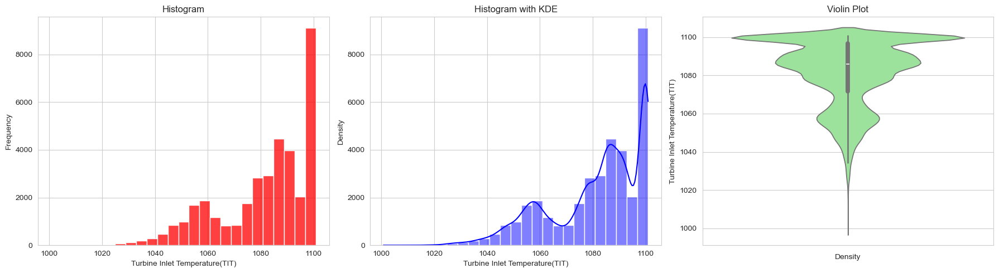

In [330]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 3 subplots side-by-side

# 1️⃣ Histogram (histplot)
sns.histplot(df['Turbine Inlet Temperature(TIT)'], color='red', bins=25, kde=False, ax=axes[0])
axes[0].set_title('Histogram')
axes[0].set_xlabel('Turbine Inlet Temperature(TIT)')
axes[0].set_ylabel('Frequency')

# 2️⃣ Distplot with KDE
# Note: distplot is deprecated; use displot or histplot + kdeplot going forward
sns.histplot(df['Turbine Inlet Temperature(TIT)'], color='blue', bins=25, kde=True, ax=axes[1])
axes[1].set_title('Histogram with KDE')
axes[1].set_xlabel('Turbine Inlet Temperature(TIT)')
axes[1].set_ylabel('Density')

# 3️⃣ Violin Plot
sns.violinplot(y=df['Turbine Inlet Temperature(TIT)'], color='lightgreen', ax=axes[2])
axes[2].set_title('Violin Plot')
axes[2].set_ylabel('Turbine Inlet Temperature(TIT)')
axes[2].set_xlabel('Density')

# Improve spacing
plt.tight_layout()
plt.show()


- Peak range: 1080–1100°C Massive count clustered here, Mild positive skew.(Histogram)
- KDE curve appears multimodal,Highest density lies between 1085–1095°C (KDE with Histogram)
- IQR (~1075–1100°C) Very tight—excellent for modeling, rely on TTT as a stable, low-variance feature.(Violin)


In [333]:
df["Turbine After Temperature(TAT)"].value_counts()

Turbine After Temperature(TAT)
550.01    656
550.00    648
549.98    639
549.99    628
549.96    625
         ... 
523.13      1
522.74      1
525.67      1
526.77      1
533.17      1
Name: count, Length: 2767, dtype: int64

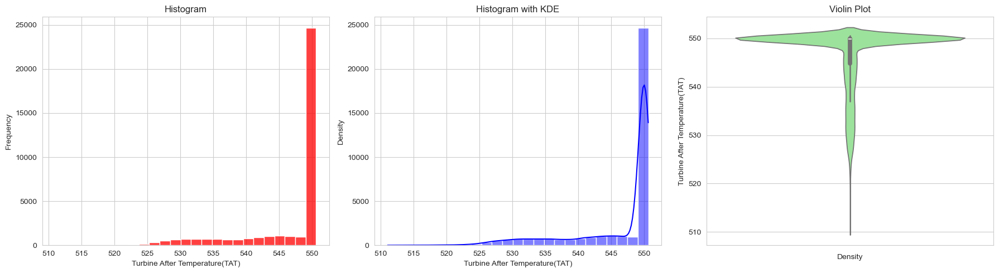

In [335]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 3 subplots side-by-side

# 1️⃣ Histogram (histplot)
sns.histplot(df['Turbine After Temperature(TAT)'], color='red', bins=25, kde=False, ax=axes[0])
axes[0].set_title('Histogram')
axes[0].set_xlabel('Turbine After Temperature(TAT)')
axes[0].set_ylabel('Frequency')

# 2️⃣ Distplot with KDE
# Note: distplot is deprecated; use displot or histplot + kdeplot going forward
sns.histplot(df['Turbine After Temperature(TAT)'], color='blue', bins=25, kde=True, ax=axes[1])
axes[1].set_title('Histogram with KDE')
axes[1].set_xlabel('Turbine After Temperature(TAT)')
axes[1].set_ylabel('Density')

# 3️⃣ Violin Plot
sns.violinplot(y=df['Turbine After Temperature(TAT)'], color='lightgreen', ax=axes[2])
axes[2].set_title('Violin Plot')
axes[2].set_ylabel('Turbine After Temperature(TAT)')
axes[2].set_xlabel('Density')

# Improve spacing
plt.tight_layout()
plt.show()

- Shows strong central tendency around 550, with frequency peaking near 25,000.(Histogram)
- The smooth curve traces the density elegantly, reinforcing the peak around 550.(Histogram with KDE)
- Reveals a symmetric, tight distribution (Violin)


In [338]:
df["Turbine Energy Yield(TEY)"].value_counts()

Turbine Energy Yield(TEY)
133.78    185
133.74    174
133.76    168
133.67    163
133.79    149
         ... 
118.12      1
106.36      1
116.53      1
107.24      1
144.16      1
Name: count, Length: 6222, dtype: int64

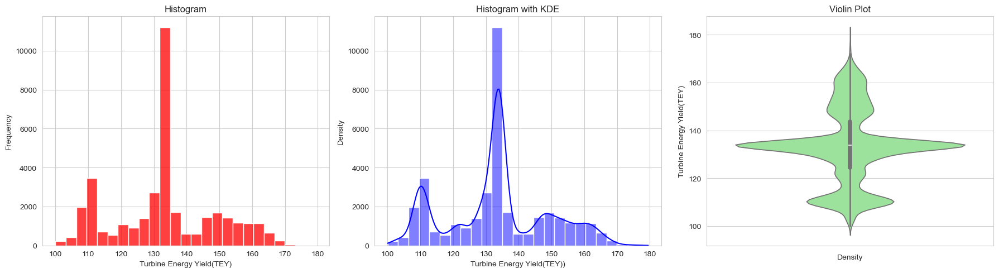

In [340]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 3 subplots side-by-side

# 1️⃣ Histogram (histplot)
sns.histplot(df['Turbine Energy Yield(TEY)'], color='red', bins=25, kde=False, ax=axes[0])
axes[0].set_title('Histogram')
axes[0].set_xlabel('Turbine Energy Yield(TEY)')
axes[0].set_ylabel('Frequency')

# 2️⃣ Distplot with KDE
# Note: distplot is deprecated; use displot or histplot + kdeplot going forward
sns.histplot(df['Turbine Energy Yield(TEY)'], color='blue', bins=25, kde=True, ax=axes[1])
axes[1].set_title('Histogram with KDE')
axes[1].set_xlabel('Turbine Energy Yield(TEY))')
axes[1].set_ylabel('Density')

# 3️⃣ Violin Plot
sns.violinplot(y=df['Turbine Energy Yield(TEY)'], color='lightgreen', ax=axes[2])
axes[2].set_title('Violin Plot')
axes[2].set_ylabel('Turbine Energy Yield(TEY)')
axes[2].set_xlabel('Density')

# Improve spacing
plt.tight_layout()
plt.show()

- TEY values between 130–150 dominate the frequency chart, with a clear peak around 140.(Histogram)
- KDE curve gently rises to a peak near 140 TEY, a mild positive skew(Histogram with KDE)
-  The plot is elegantly symmetrical around 140, reinforcing a centered distribution. Low-variance feature → ideal for ML(Violin)

In [342]:
df["Compressor Discharge Pressure(CDP)"].value_counts()

Compressor Discharge Pressure(CDP)
11.891    55
11.872    47
11.908    46
11.902    45
11.899    44
          ..
12.536     1
10.793     1
10.115     1
12.638     1
14.267     1
Name: count, Length: 4443, dtype: int64

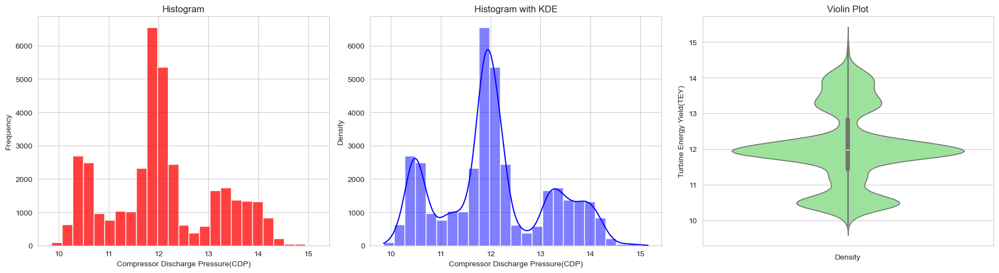

In [345]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 3 subplots side-by-side

# 1️⃣ Histogram (histplot)
sns.histplot(df['Compressor Discharge Pressure(CDP)'], color='red', bins=25, kde=False, ax=axes[0])
axes[0].set_title('Histogram')
axes[0].set_xlabel('Compressor Discharge Pressure(CDP)')
axes[0].set_ylabel('Frequency')

# 2️⃣ Distplot with KDE
# Note: distplot is deprecated; use displot or histplot + kdeplot going forward
sns.histplot(df['Compressor Discharge Pressure(CDP)'], color='blue', bins=25, kde=True, ax=axes[1])
axes[1].set_title('Histogram with KDE')
axes[1].set_xlabel('Compressor Discharge Pressure(CDP)')
axes[1].set_ylabel('Density')

# 3️⃣ Violin Plot
sns.violinplot(y=df['Compressor Discharge Pressure(CDP)'], color='lightgreen', ax=axes[2])
axes[2].set_title('Violin Plot')
axes[2].set_ylabel('Turbine Energy Yield(TEY)')
axes[2].set_xlabel('Density')

# Improve spacing
plt.tight_layout()
plt.show()

- Strong concentration around 12 units(Histogram)
- KDE hints at multiple clusters or operational states, especially with minor peaks around 11 and 13.(histogram with KDE)
- Median TEY hovers near 140, consistent with earlier distribution studies.Stable median & IQR (violin)




In [348]:
df["Carbon Monoxide(CO)"].value_counts()

Carbon Monoxide(CO)
0.11124    21
1.35600     8
1.68970     8
1.33730     8
1.78070     7
           ..
3.56850     1
3.16720     1
3.02530     1
2.84880     1
2.65650     1
Name: count, Length: 26056, dtype: int64

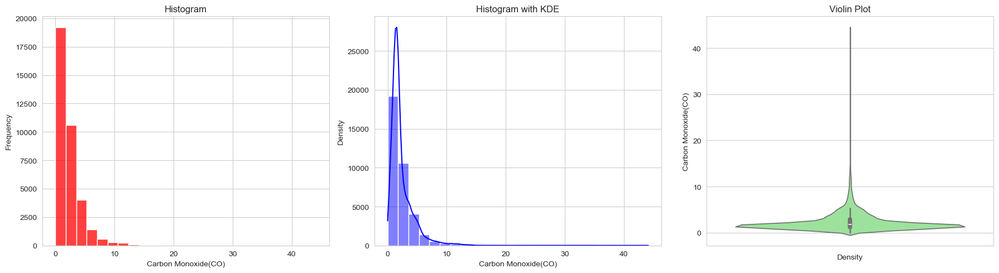

In [350]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 3 subplots side-by-side

# 1️⃣ Histogram (histplot)
sns.histplot(df['Carbon Monoxide(CO)'], color='red', bins=25, kde=False, ax=axes[0])
axes[0].set_title('Histogram')
axes[0].set_xlabel('Carbon Monoxide(CO)')
axes[0].set_ylabel('Frequency')

# 2️⃣ Distplot with KDE
# Note: distplot is deprecated; use displot or histplot + kdeplot going forward
sns.histplot(df['Carbon Monoxide(CO)'], color='blue', bins=25, kde=True, ax=axes[1])
axes[1].set_title('Histogram with KDE')
axes[1].set_xlabel('Carbon Monoxide(CO)')
axes[1].set_ylabel('Density')

# 3️⃣ Violin Plot
sns.violinplot(y=df['Carbon Monoxide(CO)'], color='lightgreen', ax=axes[2])
axes[2].set_title('Violin Plot')
axes[2].set_ylabel('Carbon Monoxide(CO)')
axes[2].set_xlabel('Density')

# Improve spacing
plt.tight_layout()
plt.show()

-  CO levels clustering heavily around 0–5 units, with a rapid drop-off beyond that(Histogram)
-   positive skew—very few high CO events (Histogram with KDE)
-   Strong lower-end bulge with tight tapering toward the high end—suggests most CO readings are clean and stable.(violin)


  


In [353]:
df["Nitrogen Oxides(NOX)"].value_counts()

Nitrogen Oxides(NOX)
60.380    104
64.096      9
64.109      8
59.354      7
64.105      7
         ... 
62.232      1
65.170      1
62.227      1
63.737      1
64.824      1
Name: count, Length: 23547, dtype: int64

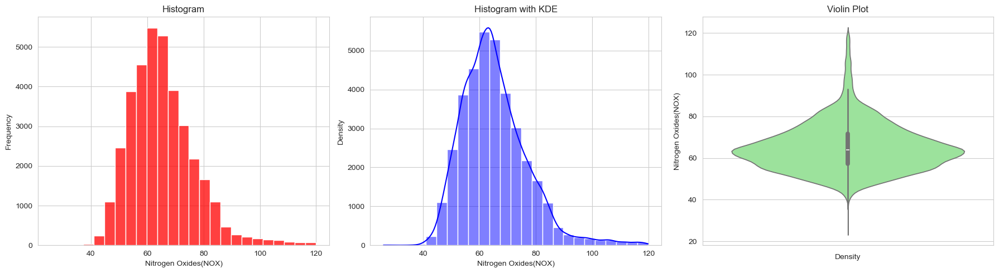

In [355]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 3 subplots side-by-side

# 1️⃣ Histogram (histplot)
sns.histplot(df['Nitrogen Oxides(NOX)'], color='red', bins=25, kde=False, ax=axes[0])
axes[0].set_title('Histogram')
axes[0].set_xlabel('Nitrogen Oxides(NOX)')
axes[0].set_ylabel('Frequency')

# 2️⃣ Distplot with KDE
# Note: distplot is deprecated; use displot or histplot + kdeplot going forward
sns.histplot(df['Nitrogen Oxides(NOX)'], color='blue', bins=25, kde=True, ax=axes[1])
axes[1].set_title('Histogram with KDE')
axes[1].set_xlabel('Nitrogen Oxides(NOX)')
axes[1].set_ylabel('Density')

# 3️⃣ Violin Plot
sns.violinplot(y=df['Nitrogen Oxides(NOX)'], color='lightgreen', ax=axes[2])
axes[2].set_title('Violin Plot')
axes[2].set_ylabel('Nitrogen Oxides(NOX)')
axes[2].set_xlabel('Density')

# Improve spacing
plt.tight_layout()
plt.show()

- Most NOX values huddle in the 40–80 range, peaking around 60–65. - Nearly symmetrical, but possibly a touch of right skew beyond 80.(Histogram)
- KDE curve flows elegantly with no distortion, centering near 60 NOX units. (Histogram with KDE)
- The violin is gently symmetrical around 60–65, suggesting a centered distribution.(violin)






# <span style="color:yellow">***Bivariate Analysis*** </span>

In [359]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 36526 entries, 0 to 36536
Data columns (total 11 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Ambient Temperature(AT)               36526 non-null  float64
 1   Ambient Pressure(AP)                  36526 non-null  float64
 2   Ambient Humidity(AH)                  36526 non-null  float64
 3   Air Filter Difference Pressure(AFDP)  36526 non-null  float64
 4   Gas Turbine Exhaust Pressure(GTEP)    36526 non-null  float64
 5   Turbine Inlet Temperature(TIT)        36526 non-null  float64
 6   Turbine After Temperature(TAT)        36526 non-null  float64
 7   Turbine Energy Yield(TEY)             36526 non-null  float64
 8   Compressor Discharge Pressure(CDP)    36526 non-null  float64
 9   Carbon Monoxide(CO)                   36526 non-null  float64
 10  Nitrogen Oxides(NOX)                  36526 non-null  float64
dtypes: float64(11)
memor

# Dependency of Target variable on diff Features

<Axes: xlabel='Ambient Temperature(AT)', ylabel='Turbine Energy Yield(TEY)'>

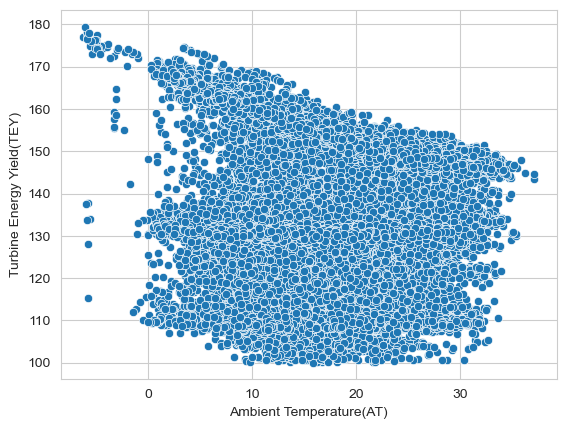

In [362]:
sns.scatterplot(data=df, x='Ambient Temperature(AT)', y='Turbine Energy Yield(TEY)')


- <span style="color:red">Negative Trend:<span> <span style="color:yellow">As AT increases from around 5°C to 30°C, TEY visibly declines. You’re seeing a drop from roughly 175 down to 110, indicating that hotter intake air reduces turbine performance.<span>
- <span style="color:yellow">Gradual Descent: The slope isn’t sharp but steady, suggesting a consistent loss in output with rising temperature.<span>


<Axes: xlabel='Ambient Temperature(AT)', ylabel='Turbine Energy Yield(TEY)'>

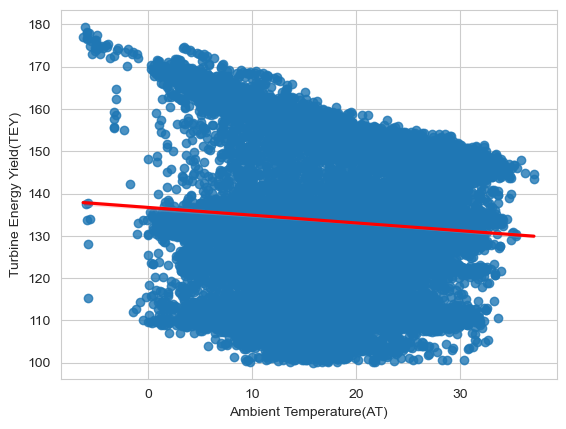

In [365]:
# Regression plot with line
sns.regplot(data=df, x='Ambient Temperature(AT)', y='Turbine Energy Yield(TEY)', line_kws={"color":"red"})

<span style="color:red">This scatter plot shows the negative correlation between Ambient Temperature (AT) and Turbine Energy Yield (TEY) — and the red regression line confirms it with clarity.<span>

- <span style="color:yellow">As AT rises, TEY drops — consistently and predictably.<span>
- <span style="color:yellow">The slope of the red line signals a steady decline.<span>

<Axes: xlabel='Ambient Pressure(AP)', ylabel='Turbine Energy Yield(TEY)'>

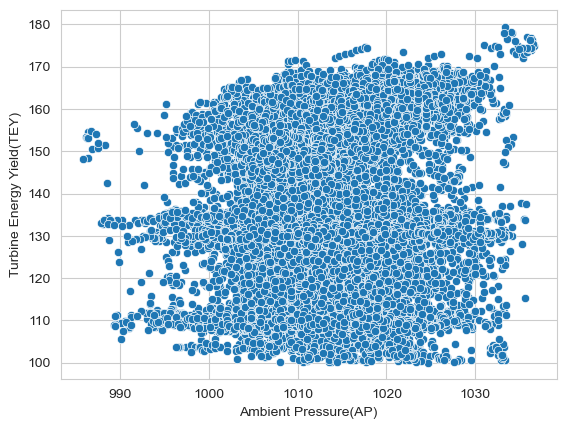

In [368]:
sns.scatterplot(data=df, x='Ambient Pressure(AP)', y='Turbine Energy Yield(TEY)')

- <span style="color:yellow">Slight Positive Correlation: TEY tends to be higher when AP increases — many points at AP > 1020 hPa position around TEY ≥ 160, while lower AP values (around 980) correspond with more scatter and lower yields.<span>


<Axes: xlabel='Ambient Pressure(AP)', ylabel='Turbine Energy Yield(TEY)'>

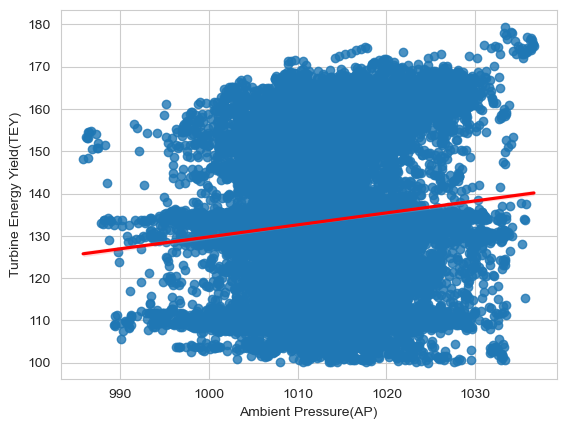

In [371]:
# Regression plot with line
sns.regplot(data=df, x='Ambient Pressure(AP)', y='Turbine Energy Yield(TEY)', line_kws={"color":"red"})

- <span style="color:blue">Positive Correlation:<span> <span style="color:yellow">The red trend line is gently sloping upward, shows that Turbine Energy Yield (TEY) improves slightly as Ambient Pressure (AP) increases.<span>
- <span style="color:yellow">Denser clustering around AP ≈ 1010–1025 with TEY values above 160 hints at a pressure  which is most effective<span>


<Axes: xlabel='Ambient Humidity(AH)', ylabel='Turbine Energy Yield(TEY)'>

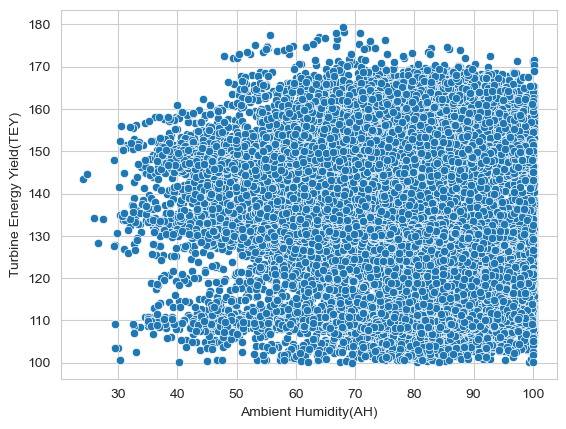

In [373]:
sns.scatterplot(data=df, x='Ambient Humidity(AH)', y='Turbine Energy Yield(TEY)')


<Axes: xlabel='Ambient Humidity(AH)', ylabel='Turbine Energy Yield(TEY)'>

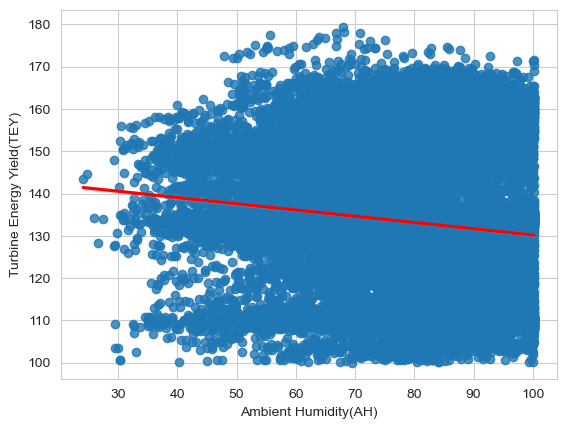

In [374]:
# Regression plot with line
sns.regplot(data=df, x='Ambient Humidity(AH)', y='Turbine Energy Yield(TEY)', line_kws={"color":"red"})

 <span style="color:yellow">AH vs. TEY plot — complete with that red regression line — reinforces the  <span style="color:red">negative correlation<span> <span style="color:yellow">between Ambient Humidity and Turbine Energy Yield in clear terms.<span>


<Axes: xlabel='Air Filter Difference Pressure(AFDP)', ylabel='Turbine Energy Yield(TEY)'>

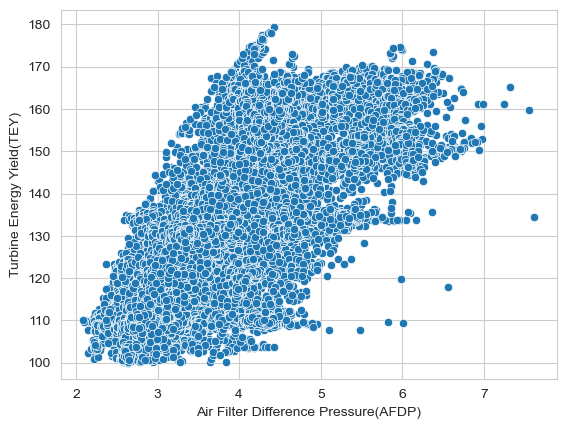

In [378]:

sns.scatterplot(data=df, x='Air Filter Difference Pressure(AFDP)', y='Turbine Energy Yield(TEY)')



<Axes: xlabel='Air Filter Difference Pressure(AFDP)', ylabel='Turbine Energy Yield(TEY)'>

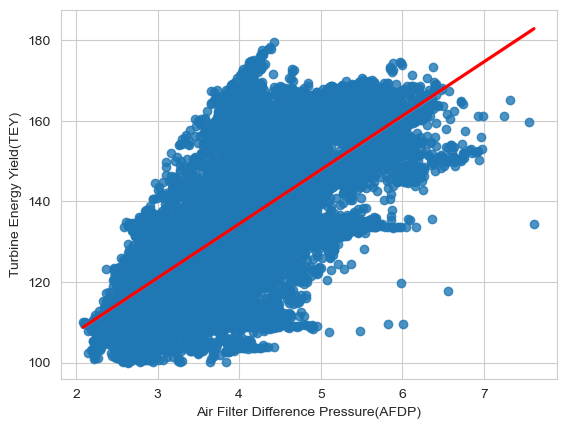

In [379]:
# Regression plot with line
sns.regplot(data=df, x='Air Filter Difference Pressure(AFDP)', y='Turbine Energy Yield(TEY)', line_kws={"color":"red"})

- <span style="color:blue">Clear Positive Correlation:<span><span style="color:yellow"> As Air Filter Difference Pressure (AFDP) climbs from ~2 to 7, Turbine Energy Yield (TEY) also increases — many points even break past 160 when AFDP is >5.<span>
- <span style="color:yellow">Denser Points at Higher Yields: TEY between 160–180 is mostly clustered around AFDP levels of 5 to 6.5, hinting at optimal pressure ranges.<span>


- Linear Trendline: The red line solidifies the positive linear relationship — as AFDP increases, TEY consistently rises.



- <span style="color:blue">Strong Positive Linear Correlation:<span> <span style="color:yellow">As AFDP increases from roughly 2 to 7, TEY climbs from ~110 to ~180.
- <span style="color:yellow">Regression Line: The slope gives clear directionality, and the data points tightly hug the trend — indicating low variance and high modeling reliability.


<Axes: xlabel='Gas Turbine Exhaust Pressure(GTEP)', ylabel='Turbine Energy Yield(TEY)'>

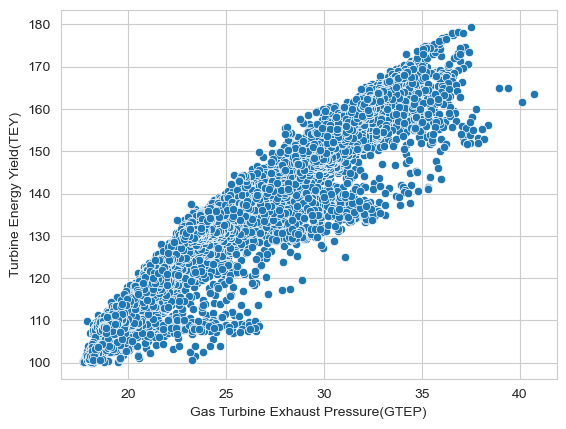

In [386]:
sns.scatterplot(data=df, x='Gas Turbine Exhaust Pressure(GTEP)', y='Turbine Energy Yield(TEY)')

- <span style="color:blue">Positive Correlation Confirmed: <span><span style="color:yellow">The upward trend shows that as GTEP rises from 20 to 40, TEY steadily increases, often breaching 160+ beyond the mid-30s.
- <span style="color:yellow">High-Density Yield Zone: TEY values between 160 and 180 are largely concentrated around GTEP levels of 35–40, possibly identifying a pressure “sweet spot” for optimal energy conversion.


<Axes: xlabel='Gas Turbine Exhaust Pressure(GTEP)', ylabel='Turbine Energy Yield(TEY)'>

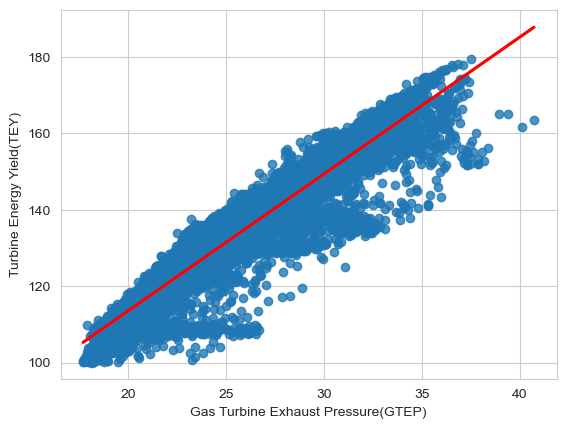

In [389]:
# Regression plot with line
sns.regplot(data=df, x='Gas Turbine Exhaust Pressure(GTEP)', y='Turbine Energy Yield(TEY)', line_kws={"color":"red"})

- <span style="color:blue">Strong Positive Trend:<span><span style="color:yellow"> As GTEP rises from ~15 to 40, TEY consistently climbs from ~100 to nearly 180. That red regression line cuts clean through the   data cloud, showing a reliable upward trajectory.<span>
- <span style="color:yellow">Predictability: The points follow the line tightly—minimal scatter means GTEP has a solid, linear influence on yield.<span>
- <span style="color:yellow">High-Yield Zone: TEY levels above 160 are mostly clustered around GTEP > 35, suggesting an optimal pressure band for performance.<span>


<Axes: xlabel='Turbine After Temperature(TAT)', ylabel='Turbine Energy Yield(TEY)'>

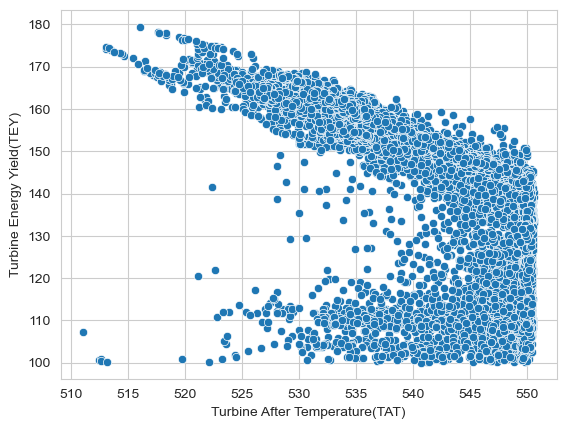

In [392]:
sns.scatterplot(data=df, x='Turbine After Temperature(TAT)', y='Turbine Energy Yield(TEY)')

- <span style="color:red">Clear Negative Correlation:<span><span style="color:yellow">  As Turbine After Temperature (TAT) rises, Turbine Energy Yield (TEY) drops consistently.<span>
- <span style="color:yellow">Efficiency Indicator: Higher TAT likely reflects energy losses due to exhaust heat, implying reduced conversion efficiency.<span>
- <span style="color:yellow">TAT Range to Watch: Values above ~540°C frequently result in TEY < 140, so that might be a red flag for performance degradation.<span>

<Axes: xlabel='Turbine After Temperature(TAT)', ylabel='Turbine Energy Yield(TEY)'>

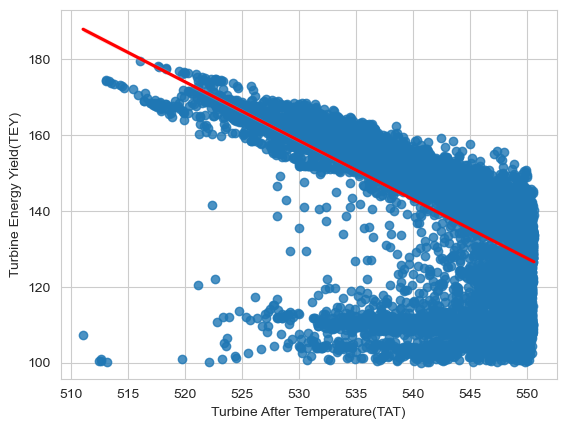

In [395]:
# Regression plot with line
sns.regplot(data=df, x='Turbine After Temperature(TAT)', y='Turbine Energy Yield(TEY)', line_kws={"color":"red"})

- <span style="color:red">Negative Trend Holds Strong:<span><span style="color:yellow"> TEY consistently drops as TAT increases—this red line confirms a predictable decline.<span>
- <span style="color:yellow">Linearity with a Punch: The scatter’s tight clustering around the line suggests a decent fit. It will give  a high R² when  run this through  regression.<span>


<Axes: xlabel='Compressor Discharge Pressure(CDP)', ylabel='Turbine Energy Yield(TEY)'>

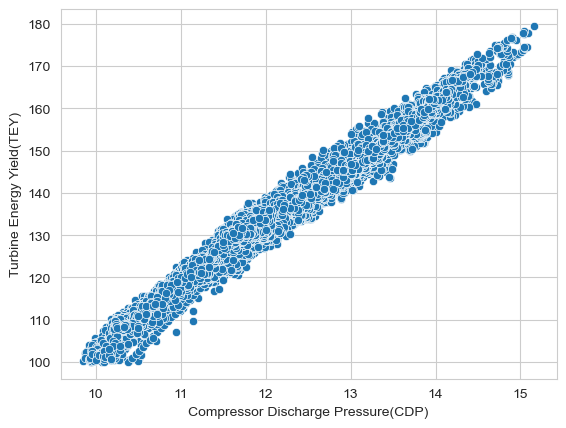

In [397]:
sns.scatterplot(data=df, x='Compressor Discharge Pressure(CDP)', y='Turbine Energy Yield(TEY)')

- <span style="color:blue">Positive Linear Relationship:<span> <span style="color:yellow">TEY climbs steadily as Compressor Discharge Pressure (CDP) rises, which makes physical sense—higher compression typically boosts combustion efficiency.<span>
- <span style="color:yellow">Well-Behaved Data: Points are nicely distributed along the regression line, signaling low noise and good model fit.<span>
- <span style="color:yellow">CDP Range to Leverage: In the 13–15 bar zone, TEY frequently exceeds 160, suggesting a performance sweet spot for pressurization.<span>


<Axes: xlabel='Compressor Discharge Pressure(CDP)', ylabel='Turbine Energy Yield(TEY)'>

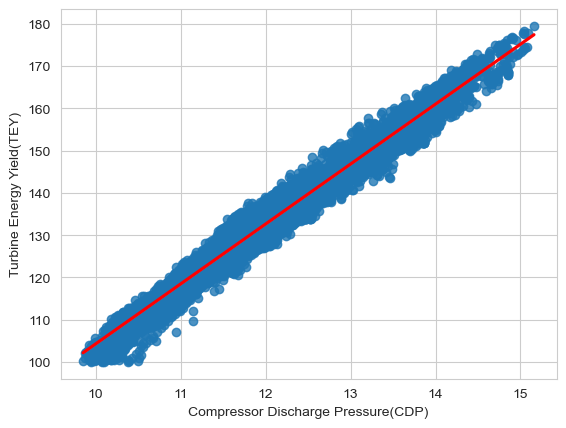

In [401]:
# Regression plot with line
sns.regplot(data=df, x='Compressor Discharge Pressure(CDP)', y='Turbine Energy Yield(TEY)', line_kws={"color":"red"})

- <span style="color:blue">Strong Positive Linear Fit:<span> <span style="color:yellow">The red regression line runs clean and steady—TEY increases sharply as CDP rises.<span>
- <span style="color:yellow">Data Cluster : Most points sit closely along the line, particularly in the CDP 13–15 bar range, which consistently delivers TEY > 160.<span>
- <span style="color:yellow">Predictability: Minimal outliers make CDP a high-confidence feature for modeling; it acts like a pressure dial directly tied to energy gain.<span>


<Axes: xlabel='Carbon Monoxide(CO)', ylabel='Turbine Energy Yield(TEY)'>

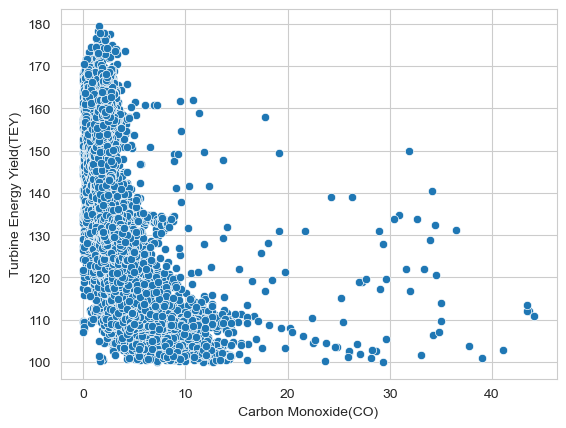

In [404]:

sns.scatterplot(data=df, x='Carbon Monoxide(CO)', y='Turbine Energy Yield(TEY)')


- <span style="color:red">Inverse Relationship:<span> <span style="color:yellow">As Carbon Monoxide (CO) levels climb, Turbine Energy Yield (TEY) consistently drops. That's a red flag for efficiency.<span>
- <span style="color:yellow">Clean Cluster Zone: Most data hugs the left side—low CO, high TEY—suggesting optimal combustion conditions.<span>
- <span style="color:yellow">Beyond 30 ppm CO: TEY plunges below 140, signaling possible incomplete combustion, poor air–fuel mix, or burner tuning issues.<span>


<Axes: xlabel='Carbon Monoxide(CO)', ylabel='Turbine Energy Yield(TEY)'>

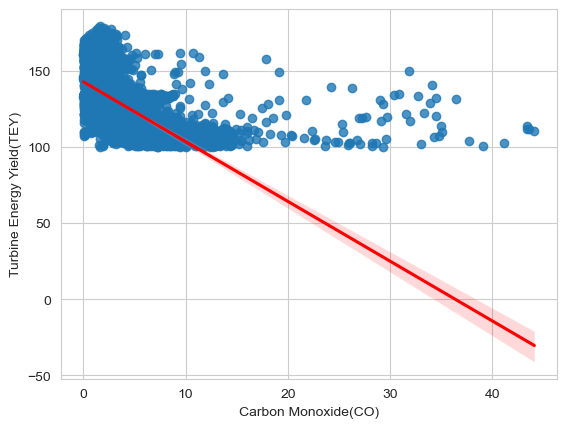

In [407]:
# Regression plot with line
sns.regplot(data=df, x='Carbon Monoxide(CO)', y='Turbine Energy Yield(TEY)', line_kws={"color":"red"})

- <span style="color:yellow">TEY Drops as CO Rises: The red regression line slopes downward, showing that as CO levels increase, Turbine Energy Yield (TEY) declines consistently.<span>
- <span style="color:yellow">Impact: TEY falls from near 150 down to almost zero as CO moves past 40 ppm .<span>
- <span style="color:yellow">Tight Data Spread: The points closely follow the line, which signals low variance and a strong linear model fit.<span>



<Axes: xlabel='Nitrogen Oxides(NOX)', ylabel='Turbine Energy Yield(TEY)'>

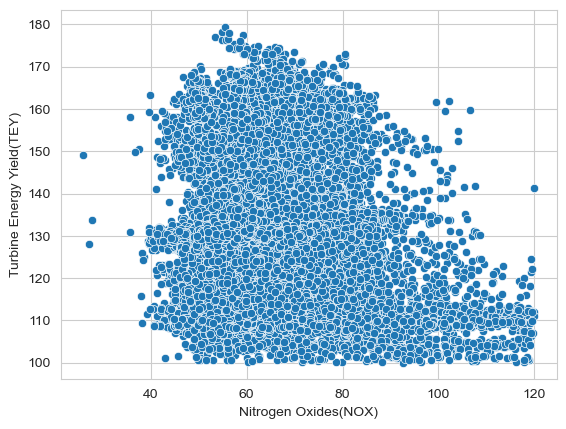

In [410]:
sns.scatterplot(data=df, x='Nitrogen Oxides(NOX)', y='Turbine Energy Yield(TEY)')


- <span style="color:blue">Positive Correlation:<span><span style="color:yellow"> As NOx levels climb from 40 to 120 ppm, the Turbine Energy Yield (TEY) steadily increases from 100 to 180.<span>
- <span style="color:yellow">Dense Point Cloud: Most data points bunch along a rising path, suggesting a strong linear relationship—possibly even stronger than what we saw with CO.<span>
- <span style="color:yellow">Consistent Gradient: The incline isn’t erratic, which implies predictability and opens doors for solid modeling.<span>


<Axes: xlabel='Nitrogen Oxides(NOX)', ylabel='Turbine Energy Yield(TEY)'>

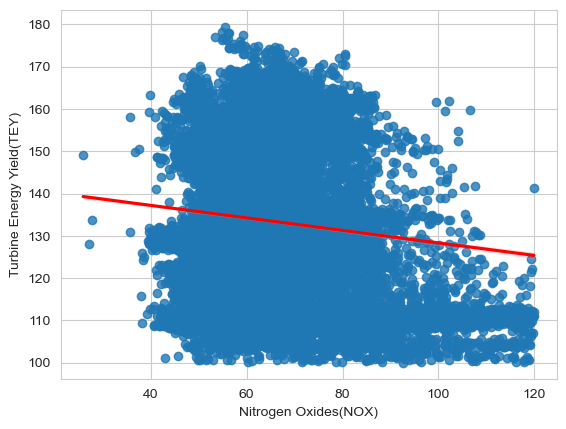

In [413]:
# Regression plot with line
sns.regplot(data=df, x='Nitrogen Oxides(NOX)', y='Turbine Energy Yield(TEY)', line_kws={"color":"red"})

- <span style="color:yellow">Despite prior plots showing NOx increasing with TEY, this one shows the opposite: TEY drops as NOx levels rise.<span>
- <span style="color:Red">The regression line slopes downward,  — the clustering suggests a reliable inverse trend.<span>
- <span style="color:yellow">This indicates a possible regime shift: maybe different operating conditions or fuel mixes skewed the relationship.<span>


<Axes: xlabel='Turbine Inlet Temperature(TIT)', ylabel='Turbine Energy Yield(TEY)'>

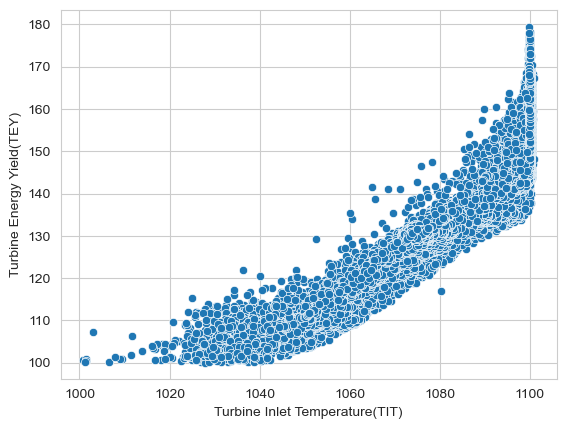

In [416]:
# Scatterplot
sns.scatterplot(data=df, x='Turbine Inlet Temperature(TIT)', y='Turbine Energy Yield(TEY)')



-<span style="color:blue">It clearly shows there is a  strong positive correlation between Turbine Inlet Temperature (TIT) and Turbine Energy Yield (TEY).<span>   
-<span style="color:yellow">As TIT increases from around 1000 to 1100, the TEY reliably climbs from about 100 to 180.<span> 

<Axes: xlabel='Turbine Inlet Temperature(TIT)', ylabel='Turbine Energy Yield(TEY)'>

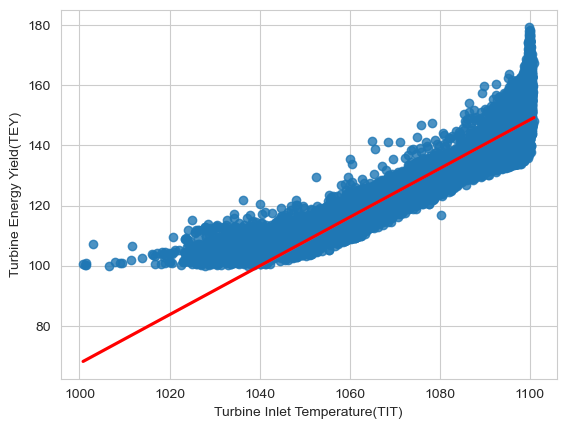

In [419]:
# Regression plot with line
sns.regplot(data=df, x='Turbine Inlet Temperature(TIT)', y='Turbine Energy Yield(TEY)', line_kws={"color":"red"})


- Linear Increase: As CDP rises from 10 to 15, TEY tracks upward — climbing from ~100 to 180.<span style="color:blue"> This suggests CDP is a reliable predictor of yield.<span>  
- <span style="color:yellow"> Regression Line in Red: The slope of the line confirms a consistent upward trend. Nice touch for interpretability.
- <span style="color:yellow"> Tight Clustering: Minimal spread around the regression line = low variance = strong signal = high confidence for modeling.<span>


- <span style="color:yellow">Higher CDP = more compressed air, which improves combustion efficiency, resulting in greater mechanical energy output and thus higher TEY.


### Ranked Correlation Metrics for TEY Prediction"


In [423]:

corr = pd.DataFrame(data = df.corr().iloc[:,7], index=df.columns)
corr = corr.sort_values(by='Turbine Energy Yield(TEY)', ascending=False)
corr

,Turbine Energy Yield(TEY)
Turbine Energy Yield(TEY),1.000000
Compressor Discharge Pressure(CDP),0.988710
Gas Turbine Exhaust Pressure(GTEP),0.964078
Turbine Inlet Temperature(TIT),0.910541
Air Filter Difference Pressure(AFDP),0.667040
Ambient Pressure(AP),0.117416
Ambient Temperature(AT),-0.087443
Nitrogen Oxides(NOX),-0.110872
Ambient Humidity(AH),-0.137667
Carbon Monoxide(CO),-0.570748


### Feature Correlation with Turbine Energy Yield (TEY)

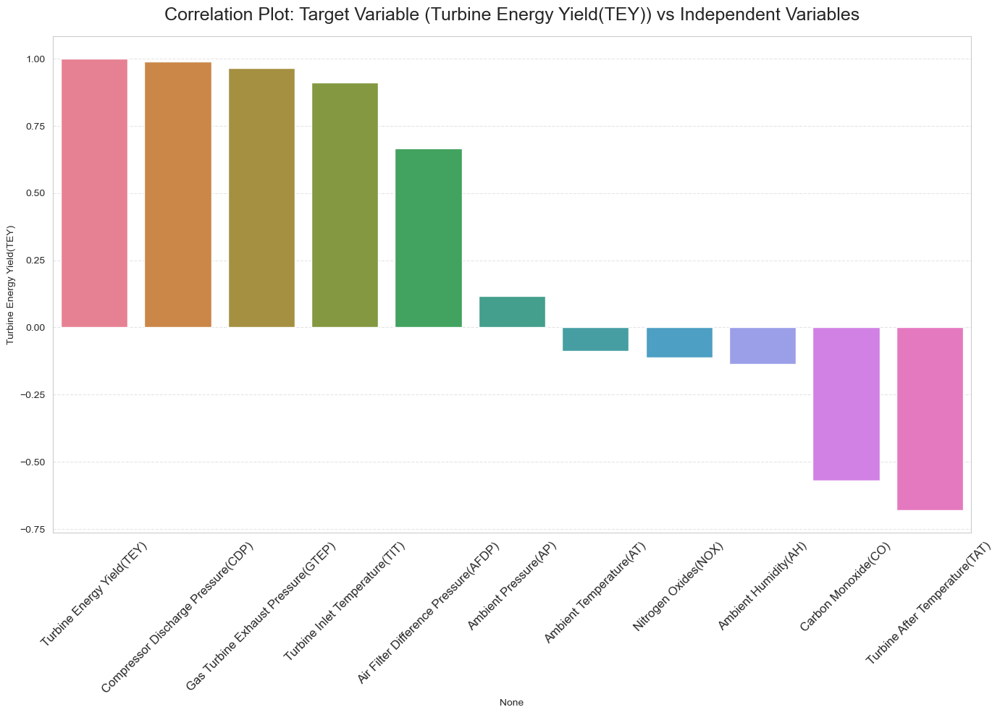

In [426]:

plt.figure(figsize=(14, 10))
custom_palette = sns.color_palette("husl", 11) # define a palette with 11 unique colors
sns.barplot(
    x=corr.index,
    y=corr["Turbine Energy Yield(TEY)"],
    palette=custom_palette
)

plt.title("Correlation Plot: Target Variable (Turbine Energy Yield(TEY)) vs Independent Variables", fontsize=18, y=1.02)
plt.xticks(rotation=45, ha='center', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


Top Positive Correlation
-  Compressor Discharge Pressure (CDP)
-  Gas Turbine Exhaust Pressure (GTEP)
-  Turbine Inlet Temperature (TIT): These are heavily involved in the turbine’s internal energy dynamics — more pressure and temperature means more energy yield.
- Air Filter Difference Pressure (AFDP): Moderately positive, possibly improving airflow efficiency.

- Ambient Pressure (AP) and Ambient Temperature (AT): Slightly positive, but their effect on TEY isn't strong.

 Negative Correlations
- Nitrogen Oxides (NOX) and Ambient Humidity (AH): Weakly negative.
- Carbon Monoxide (CO) and Turbine After Temperature (TAT): More strongly negative 


# <span style="color:yellow">***Skewness checking*** </span>

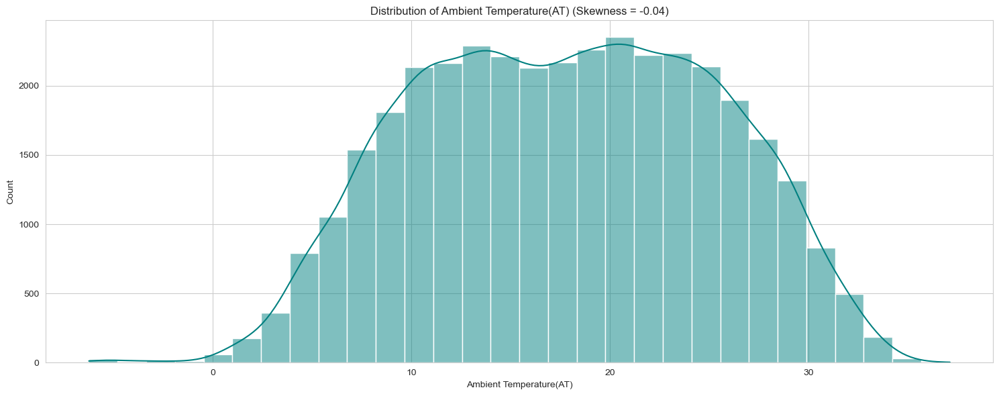

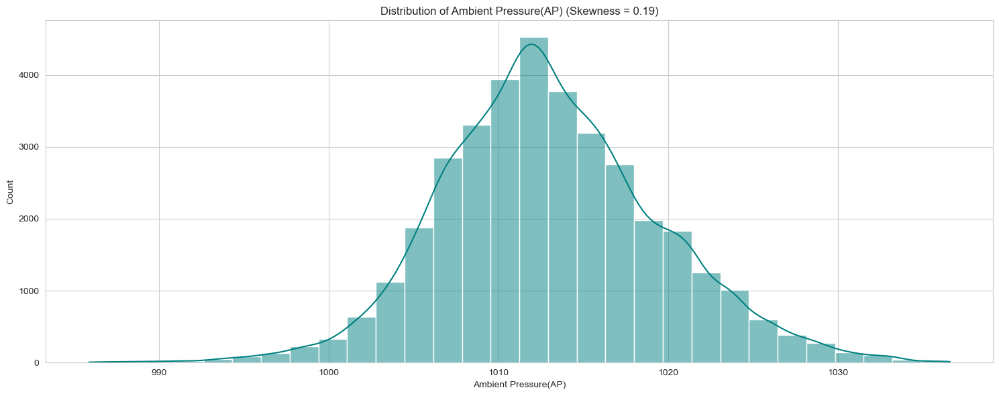

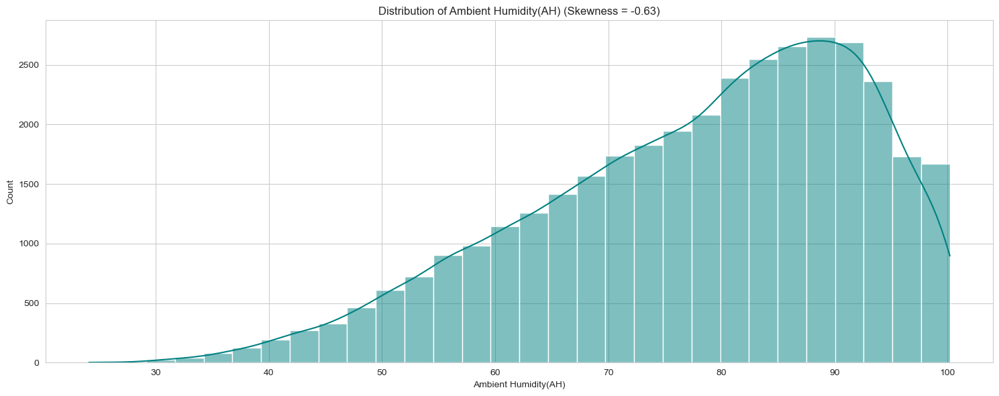

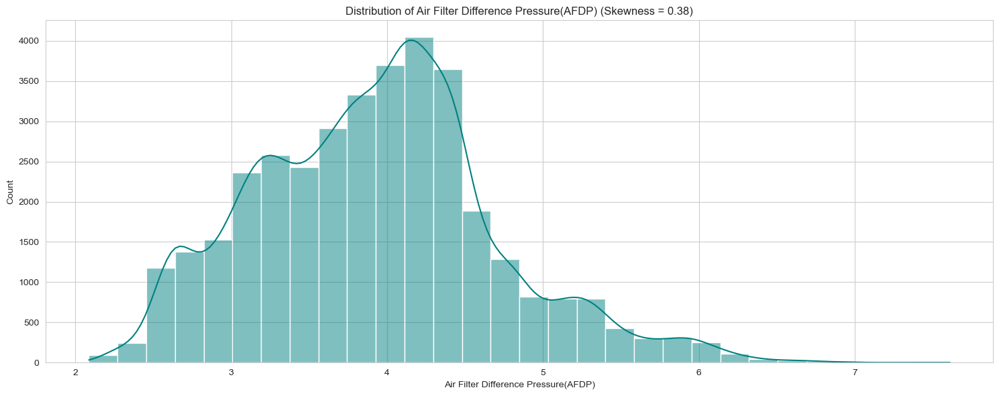

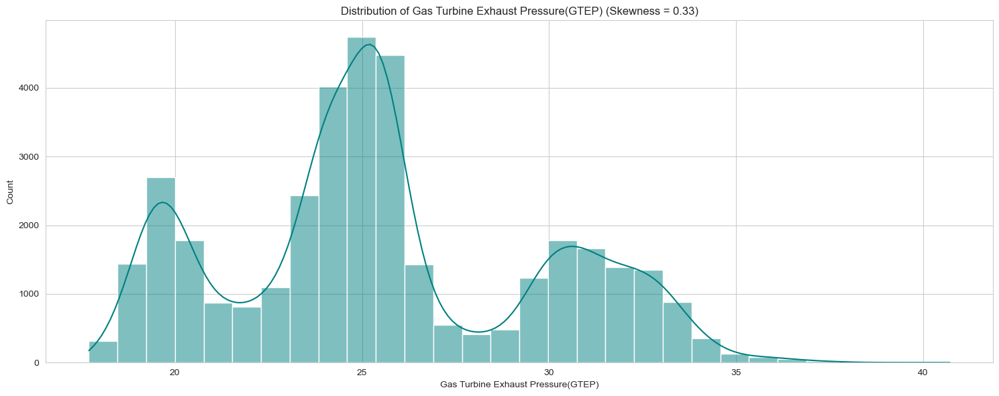

...

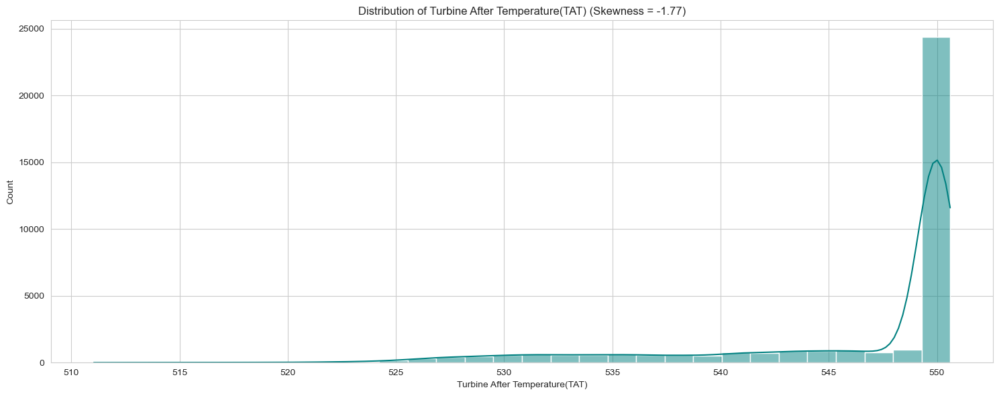

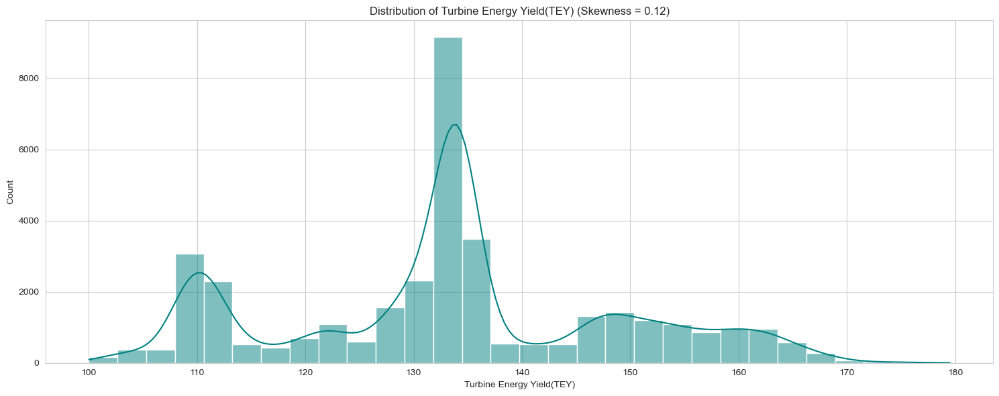

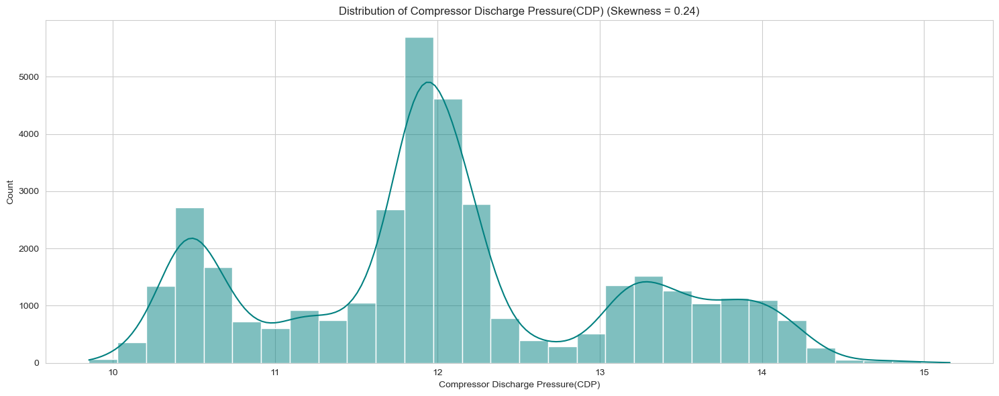

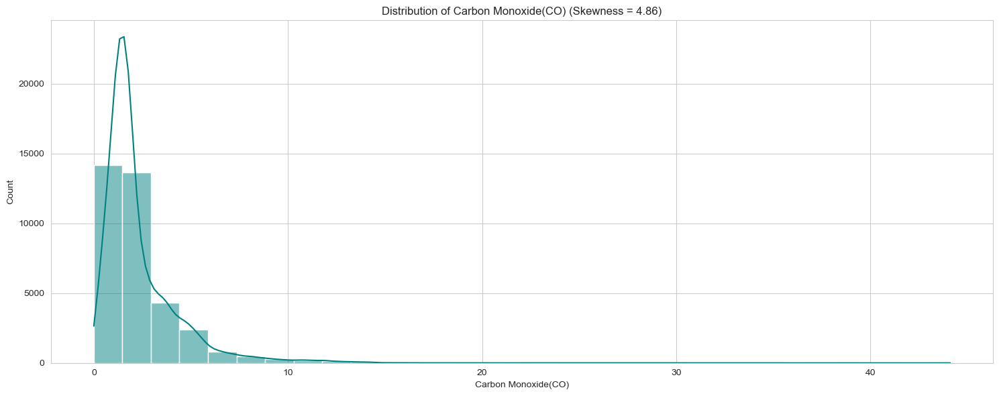

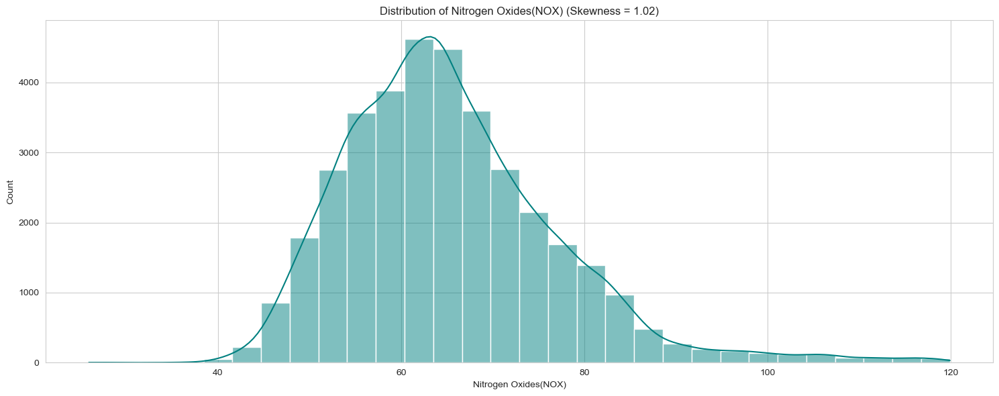

In [430]:
import matplotlib.pyplot as plt
import seaborn as sns

# 'Turbine Energy Yield(TEY) is the target column hence removed from the numeric_column

# List of numeric features to apply filtering on
numeric_cols = ['Ambient Temperature(AT)', 'Ambient Pressure(AP)',
       'Ambient Humidity(AH)', 'Air Filter Difference Pressure(AFDP)',
       'Gas Turbine Exhaust Pressure(GTEP)', 'Turbine Inlet Temperature(TIT)',
       'Turbine After Temperature(TAT)','Turbine Energy Yield(TEY)',
       'Compressor Discharge Pressure(CDP)', 'Carbon Monoxide(CO)',
       'Nitrogen Oxides(NOX)']

for col in numeric_cols:
    plt.figure(figsize=(15,6))
    sns.histplot(df[col], kde=True, bins=30, color='teal')
    plt.title(f'Distribution of {col} (Skewness = {df[col].skew():.2f})')
    plt.xlabel(col)
    plt.tight_layout()
    plt.show()

keep a copy of the df before skewness checking

In [432]:
df.to_csv('df_before_skew.csv', index=False)


### read the pre-processed df

In [436]:
# Specify the path to your CSV file
csv_file_path = ('C:/Users/asus/df_before_skew.csv')

# Load the CSV file into a DataFrame
df=pd.read_csv("df_before_skew.csv")


### Display Outlier count per feature

In [440]:
outliers_dict = {}

for col in df.select_dtypes(include='number').columns:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    outliers_dict[col] = outliers.shape[0]  # count of outliers for each feature

# Display outlier count per feature
print("Outlier count per feature:")
for feature, count in outliers_dict.items():
    print(f"{feature}: {count}")


Outlier count per feature:
Ambient Temperature(AT): 3
Ambient Pressure(AP): 608
Ambient Humidity(AH): 126
Air Filter Difference Pressure(AFDP): 553
Gas Turbine Exhaust Pressure(GTEP): 11
Turbine Inlet Temperature(TIT): 319
Turbine After Temperature(TAT): 4971
Turbine Energy Yield(TEY): 45
Compressor Discharge Pressure(CDP): 16
Carbon Monoxide(CO): 2653
Nitrogen Oxides(NOX): 922


## outlier visualization using the Boxplot

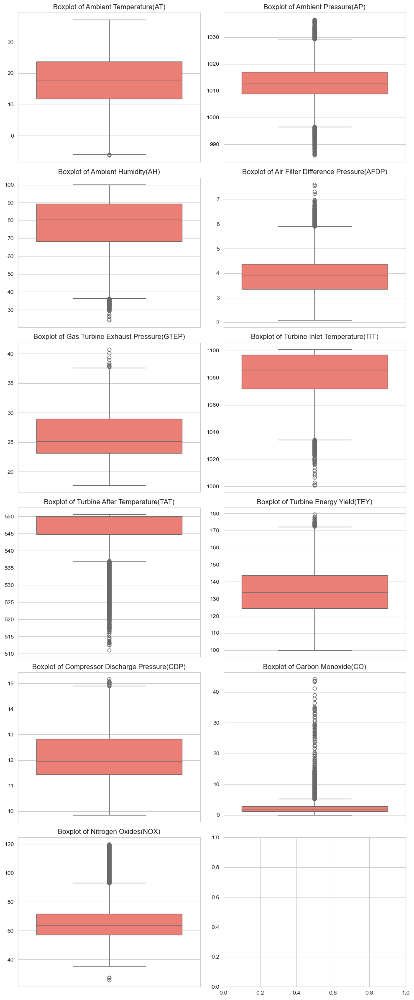

In [443]:
# Select numeric columns
num_cols = df.select_dtypes(include='number').columns

# Set up the figure
n_cols = 2  # number of plots per row (adjust as needed)
n_rows = 6  # calculate needed rows
# n_rows = (len(num_cols) + n_cols - 1) // n_cols  # calculate needed rows
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows))
axes = axes.flatten()  # flatten axes array for easy iteration

# Plot each boxplot
for i, col in enumerate(num_cols):
    sns.boxplot(y=df[col], ax=axes[i], color='#FF6F61')
    axes[i].set_title(f'Boxplot of {col}', fontsize=12)
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)



plt.tight_layout()
plt.show()



### Preprocessing: Clipping Extremes with Quartile Thresholds

In [185]:

df_original = df.copy()  # Freeze original state before clipping

clipped_df = df.copy()  # Prevent modifying original

for col in num_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    clipped_df[col] = df[col].clip(lower=lower_bound, upper=upper_bound)


### Clipped range of each features

In [455]:

for col in num_cols:
    lower_bound = df[col].quantile(0.25)
    upper_bound = df[col].quantile(0.75)
    df[col] = df[col].clip(lower=lower_bound, upper=upper_bound)
    
    print(f"{col}: Clipped to range [{lower_bound:.2f}, {upper_bound:.2f}]")



Ambient Temperature(AT): Clipped to range [11.85, 23.70]
Ambient Pressure(AP): Clipped to range [1008.80, 1017.00]
Ambient Humidity(AH): Clipped to range [68.16, 89.40]
Air Filter Difference Pressure(AFDP): Clipped to range [3.36, 4.38]
Gas Turbine Exhaust Pressure(GTEP): Clipped to range [23.13, 28.97]
Turbine Inlet Temperature(TIT): Clipped to range [1071.80, 1096.80]
Turbine After Temperature(TAT): Clipped to range [544.82, 550.04]
Turbine Energy Yield(TEY): Clipped to range [124.47, 143.67]
Compressor Discharge Pressure(CDP): Clipped to range [11.44, 12.82]
Carbon Monoxide(CO): Clipped to range [1.18, 2.84]
Nitrogen Oxides(NOX): Clipped to range [57.15, 71.55]


### Quantifying Data Modifications from Interquartile Filtering

In [460]:
clipped_counts = {}

for col in num_cols:
    lower_bound = df[col].quantile(0.25)
    upper_bound = df[col].quantile(0.75)
    
    # Identify values to be clipped
    original = df[col]
    clipped = original.clip(lower=lower_bound, upper=upper_bound)
    
    # Count how many values were modified
    count_clipped = (original != clipped).sum()
    clipped_counts[col] = count_clipped
    
    # Update column with clipped values
    df[col] = clipped
    
    print(f"{col}: Clipped to range [{lower_bound:.2f}, {upper_bound:.2f}] — {count_clipped} values clipped")

# Summary
print("\n📋 Summary of clipped values per feature:")
for col, count in clipped_counts.items():
    print(f"{col}: {count}")


Ambient Temperature(AT): Clipped to range [11.85, 23.70] — 9132 values clipped
Ambient Pressure(AP): Clipped to range [1008.80, 1017.00] — 0 values clipped
Ambient Humidity(AH): Clipped to range [68.16, 89.40] — 18264 values clipped
Air Filter Difference Pressure(AFDP): Clipped to range [3.36, 4.38] — 9132 values clipped
Gas Turbine Exhaust Pressure(GTEP): Clipped to range [23.13, 28.97] — 0 values clipped
Turbine Inlet Temperature(TIT): Clipped to range [1071.80, 1096.80] — 0 values clipped
Turbine After Temperature(TAT): Clipped to range [544.82, 550.04] — 0 values clipped
Turbine Energy Yield(TEY): Clipped to range [124.47, 143.67] — 9132 values clipped
Compressor Discharge Pressure(CDP): Clipped to range [11.44, 12.82] — 9132 values clipped
Carbon Monoxide(CO): Clipped to range [1.18, 2.84] — 9132 values clipped
Nitrogen Oxides(NOX): Clipped to range [57.15, 71.55] — 18264 values clipped

📋 Summary of clipped values per feature:
Ambient Temperature(AT): 9132
Ambient Pressure(AP): 0

### Boxplot comparison of outliers --------     Original Vs Clipped 

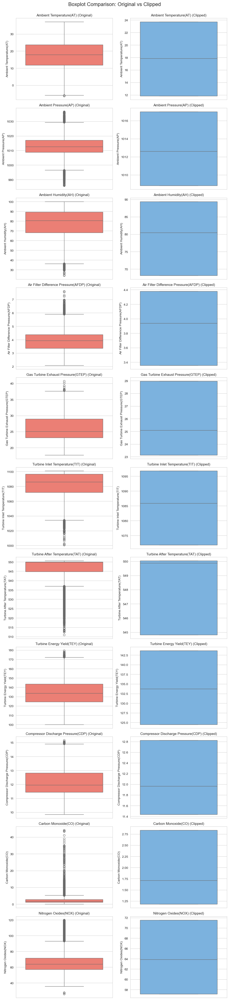

In [462]:
fig, axes = plt.subplots(len(num_cols), 2, figsize=(10, 4 * len(num_cols)))
axes = axes.reshape(len(num_cols), 2)
fig.suptitle('Boxplot Comparison: Original vs Clipped', fontsize=16)

for i, col in enumerate(num_cols):
    # Left plot: Original
    sns.boxplot(y=df_original[col], ax=axes[i, 0], color='#FF6F61')
    axes[i, 0].set_title(f'{col} (Original)', fontsize=11)
    axes[i, 0].tick_params(axis='x', bottom=False, top=False, labelbottom=False)

    # Right plot: Clipped
    sns.boxplot(y=df_clipped[col], ax=axes[i, 1], color='#6CB4EE')
    axes[i, 1].set_title(f'{col} (Clipped)', fontsize=11)
    axes[i, 1].tick_params(axis='x', bottom=False, top=False, labelbottom=False)

plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()



### Skewness checking

In [467]:
import pandas as pd

# Select numeric columns
numeric_cols = df.select_dtypes(include='number').columns

# Compute skewness
skewness_values = df_clipped[numeric_cols].skew()

# Print results
print(skewness_values)


Ambient Temperature(AT)                -0.008238
Ambient Pressure(AP)                    0.055369
Ambient Humidity(AH)                   -0.134163
Air Filter Difference Pressure(AFDP)   -0.128163
Gas Turbine Exhaust Pressure(GTEP)      0.476384
Turbine Inlet Temperature(TIT)         -0.125937
Turbine After Temperature(TAT)         -0.885604
Turbine Energy Yield(TEY)               0.143231
Compressor Discharge Pressure(CDP)      0.338919
Carbon Monoxide(CO)                     0.376525
Nitrogen Oxides(NOX)                    0.070781
dtype: float64


Ambient Temperature (AT)        -0.01               very close to symmetric              
< 
Ambient Pressure (AP)          0.06              minimal skew             Symmetric  

Ambient Humidity (AH)|  -0.13| Left Skew|

Air Filter Diff. Pressure (AFDP)  -0.13  slight negative skew  

GT Exhaust Pressure (GTEP)  0.48  moderate positive skew   

Turbine Inlet Temp (TIT)   -0.13  slight negative skew  
   
Turbine After Temp (TAT)  -0.89     strong negative skew

Turbine Energy Yield (TEY)  0.14    mild positive skew  

Compressor Disch. Pressure (CDP)  0.34     mild positive skew

Carbon Monoxide (CO)  0.38   High Skew

Nitrogen Oxides (NOX)   0.07  Symetric 


Rectify the skewness with PowerTransformer

In [470]:
from sklearn.preprocessing import PowerTransformer

pt = PowerTransformer(method='yeo-johnson', standardize=False)

# Apply to your DataFrame
df_transformed = pd.DataFrame(pt.fit_transform(df_clipped), 
                              columns=df_clipped.columns, 
                              index=df_clipped.index)


Skewness after Power transformation

In [473]:
# Compute skewness
skewness_values = df_transformed[numeric_cols].skew()

# Print results
print(skewness_values)


Ambient Temperature(AT)                -0.075506
Ambient Pressure(AP)                    0.000000
Ambient Humidity(AH)                   -0.098168
Air Filter Difference Pressure(AFDP)   -0.087418
Gas Turbine Exhaust Pressure(GTEP)      0.000000
Turbine Inlet Temperature(TIT)         -0.057530
Turbine After Temperature(TAT)         -0.867533
Turbine Energy Yield(TEY)               0.024599
Compressor Discharge Pressure(CDP)      0.000000
Carbon Monoxide(CO)                     0.114500
Nitrogen Oxides(NOX)                    0.008645
dtype: float64


###  Density Estimation Side-by-Side: original vs. Transformed Data

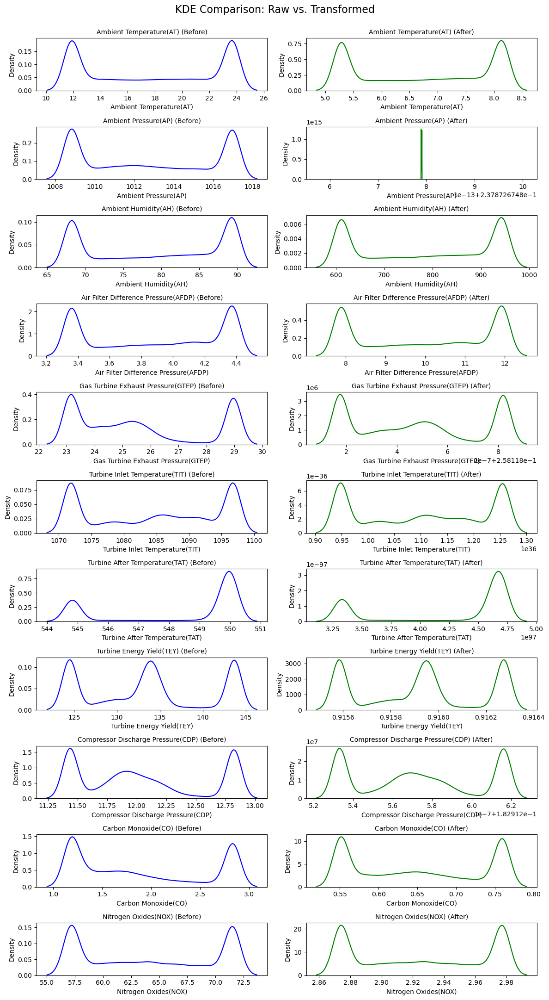

In [205]:
# Plot KDEs
fig, axes = plt.subplots(nrows=len(df_clipped.columns), ncols=2, figsize=(12, len(df_clipped.columns)*2))
fig.suptitle('KDE Comparison: Raw vs. Transformed', fontsize=16)

for i, col in enumerate(df_clipped.columns):
    # Raw KDE
    sns.kdeplot(df_clipped[col], ax=axes[i, 0], color='blue')
    axes[i, 0].set_title(f'{col} (Before)', fontsize=10)
    
    # Transformed KDE
    sns.kdeplot(df_transformed[col], ax=axes[i, 1], color='green')
    axes[i, 1].set_title(f'{col} (After)', fontsize=10)

plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()


###  Pairwise Scatter Matrix of Key Operational Metrics


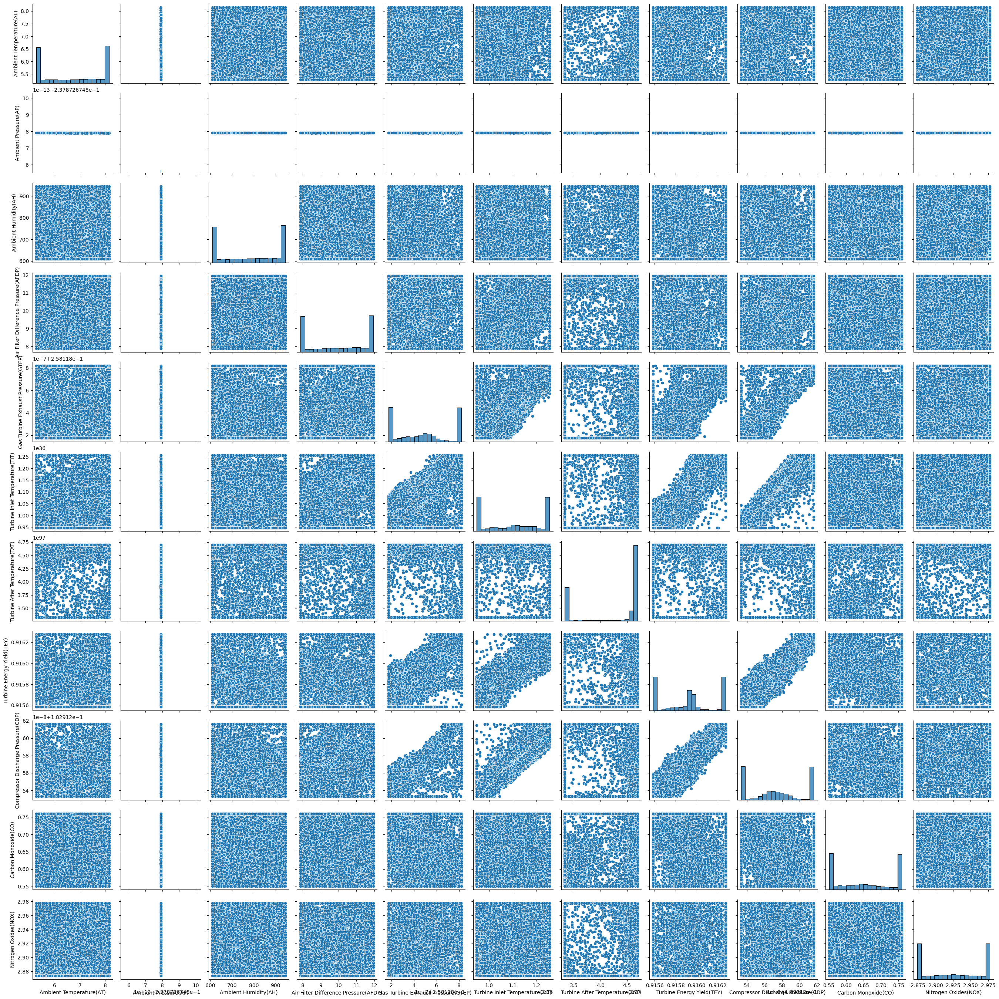

In [207]:
sns.pairplot(df_transformed)

### Heatmap of Feature Correlations Relative to TEY

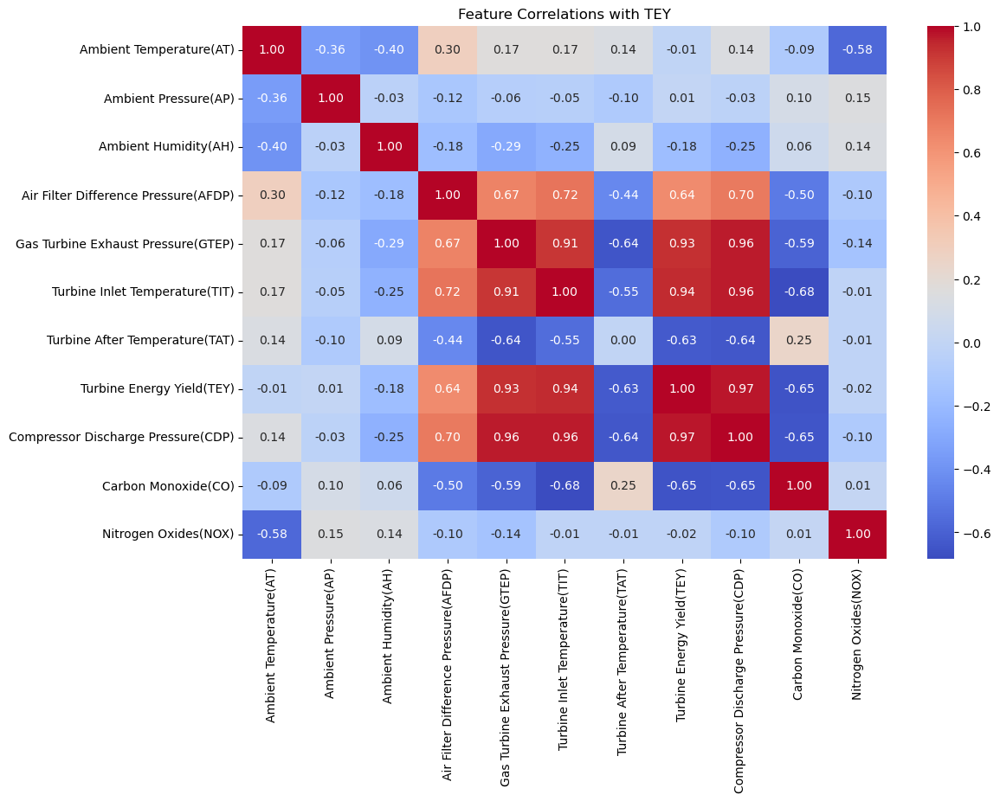

In [209]:
corr_matrix = df_transformed.corr()
plt.figure(figsize=(12,8))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Feature Correlations with TEY")
plt.show()


- TAT (Turbine Inlet Temperature) and TIT (Turbine Exit Temperature) show strong positive correlations, suggesting a direct link between thermal energy input and output yield.
- Ambient Pressure and Compressor Pressure Ratio hold moderate to strong correlations with TEY
- Variables like Ambient Temperature or Humidity may show weaker or even negative correlations
